# DATA
The data files can be downloaded [HERE](https://1drv.ms/u/s!ApnZT7aTZ9SNg5sjplM8Hj0Za7MGvw?e=KlhBKx)

# Import libraries

In order to use libraries, we first need to install and subsequently import the necessary Python packages.

In [ ]:
# install tf-nightly
# pip install -U tf-nightly

In [ ]:
# install keras-tuner
#!pip install keras-tuner

In [ ]:
# install split-folders
#!pip install split-folders

In [ ]:
# base packages
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
import keras_tuner as kt
from PIL import Image as Img
import pandas as pd
import os
import pathlib
import glob 
import matplotlib.image as mpimg
import random
import tensorflow_datasets as tfds
import matplotlib.cm as cm
import splitfolders
from IPython.display import Image, display
from matplotlib import pylab as P

# XAI packages
from tf_explain.core.grad_cam import GradCAM
from tf_explain.core.smoothgrad import SmoothGrad
from tf_explain.core.vanilla_gradients import VanillaGradients
from tf_explain.core.activations import ExtractActivations
from tf_explain.core.integrated_gradients import IntegratedGradients
from tf_explain.core.occlusion_sensitivity import OcclusionSensitivity
from tf_explain.core.gradients_inputs import GradientsInputs

# Neural Network packages
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import activations
from tensorflow.keras.models import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras.applications.xception import Xception
from sklearn.preprocessing import OneHotEncoder 

C:\Users\anouk\anaconda3\envs\DeepLearning_GPU\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# BIAS

Image classification are prone to errors and subject to bias. To identify (potential) instances of bias, I am going to perform an EDA (Exploratory Data Analysis). I will use the csv files of the data of the images for the EDA.

**Step 1**: Load the data

In [ ]:
# load the data
descriptions = pd.read_csv(r"C:\Users\anouk\OneDrive\Documenten\Toolkit\OID\csv_folder_nl\class-descriptions.csv")
train_imagelabels = pd.read_csv(r"C:\Users\anouk\OneDrive\Documenten\Toolkit\OID\csv_folder_nl\train-annotations-human-imagelabels.csv")

**Step 2**: Merge the class-descriptions and train-imagelabels tables, and name it train_label_description

The table train-imagelabels contain information on the image ids, and class labels of the Open Images V4 dataset. The corresponding class descriptions can be found in the class-descriptions table. Merging the two tables will increase the interpretability of the data: As a human being, a class description (e.g. dog) is generally more informative than a class label (e.g.'/m/0bt9lr').

In [ ]:
# merge the descriptions and the labels
train_label_description = pd.merge(descriptions, train_imagelabels)

In [ ]:
# print the info of train_label_description
print(train_label_description.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 27886817 entries, 0 to 27886816
Data columns (total 5 columns):
 #   Column       Dtype 
---  ------       ----- 
 0   LabelName    object
 1   Description  object
 2   ImageID      object
 3   Source       object
 4   Confidence   int64 
dtypes: int64(1), object(4)
memory usage: 1.2+ GB
None


**Step 3**: Subset the data by selecting one value (i.e. class) in the column LabelName located within the table train_label_description. Name the table subset. I have multiple classes, so I will create more subsets in order to find bias in all my classes.  

In [ ]:
# create subset with car class
car_subset = train_label_description.loc[(train_label_description['LabelName'] == '/m/0k4j')]
print(car_subset.head())

         LabelName Description           ImageID        Source  Confidence
27051326   /m/0k4j         Car  000002b66c9c498e  verification           0
27051327   /m/0k4j         Car  000002b97e5471a0  verification           0
27051328   /m/0k4j         Car  0000048549557964  verification           1
27051329   /m/0k4j         Car  000004f4400f6ec5  verification           0
27051330   /m/0k4j         Car  0000071d71a0a6f6  verification           0


In [ ]:
# create subset with dog class
dog_subset = train_label_description.loc[(train_label_description['LabelName'] == '/m/0bt9lr')]
print(dog_subset.head())

          LabelName Description           ImageID        Source  Confidence
22059780  /m/0bt9lr         Dog  000002b66c9c498e  verification           0
22059781  /m/0bt9lr         Dog  000002b97e5471a0  verification           0
22059782  /m/0bt9lr         Dog  0000048549557964  verification           0
22059783  /m/0bt9lr         Dog  0000071d71a0a6f6  verification           0
22059784  /m/0bt9lr         Dog  000007e5752f8f1c  verification           0


In [ ]:
# create subset with keyboard class
keyboard_subset = train_label_description.loc[(train_label_description['LabelName'] == '/m/05148p4')]
print(keyboard_subset.head())

           LabelName Description           ImageID        Source  Confidence
14201865  /m/05148p4    Keyboard  0000201cd362f303  verification           1
14201866  /m/05148p4    Keyboard  000060e3121c7305  verification           0
14201867  /m/05148p4    Keyboard  000085351f54575c  verification           0
14201868  /m/05148p4    Keyboard  0000a90019e380dc  verification           0
14201869  /m/05148p4    Keyboard  0000aa810854dc2e  verification           0


In [ ]:
# create subset with mammal class
mammal_subset = train_label_description.loc[(train_label_description['LabelName'] == '/m/04rky')]
print(mammal_subset.head())

         LabelName Description           ImageID        Source  Confidence
13262784  /m/04rky      Mammal  000002b97e5471a0  verification           0
13262785  /m/04rky      Mammal  000002c707c9895e  verification           1
13262786  /m/04rky      Mammal  000004f4400f6ec5  verification           1
13262787  /m/04rky      Mammal  0000071d71a0a6f6  verification           1
13262788  /m/04rky      Mammal  000013ba71c12506  verification           0


In [ ]:
# create subset with statue class
statue_subset = train_label_description.loc[(train_label_description['LabelName'] == '/m/013_1c')]
print(statue_subset.head())

        LabelName Description           ImageID        Source  Confidence
219156  /m/013_1c      Statue  000002b97e5471a0  verification           0
219157  /m/013_1c      Statue  000002c707c9895e  verification           0
219158  /m/013_1c      Statue  000018acd19b4ad3  verification           0
219159  /m/013_1c      Statue  00001bc2c4027449  verification           0
219160  /m/013_1c      Statue  0000253ea4ecbf19  verification           0


## Car Subset Bias

**Step 4**: Merge the tables car_subset and train_label_description. Name the newly merged table train_car.

The table should include a column filled with your chosen class label value (i.e. LabelName_y), and another column containing the additional class labels (i.e. Description_x) associated with a particular image (i.e. ImageID).

In [ ]:
#Merge train_label_class and wedding datasets, and remove redundant column
train_car = train_label_description.merge(car_subset, on='ImageID', how='inner')

train_car = train_car.drop(columns=['Source_y'])

print(train_car.head(10))

   LabelName_x     Description_x           ImageID      Source_x  \
0  /m/0100nhbf  Sprenger's tulip  00017c3c4989432b  verification   
1  /m/011q46kg         Container  00017c3c4989432b  verification   
2    /m/011yvr        Plantation  00017c3c4989432b  verification   
3    /m/01280g          Wildlife  00017c3c4989432b  verification   
4    /m/012v8q               Bog  00017c3c4989432b  verification   
5     /m/0134l            Autumn  00017c3c4989432b  verification   
6    /m/013sbk     Aquatic plant  00017c3c4989432b  verification   
7     /m/0149r          Aquarium  00017c3c4989432b  verification   
8    /m/015fyw             Poppy  00017c3c4989432b  verification   
9     /m/015p6              Bird  00017c3c4989432b  verification   

   Confidence_x LabelName_y Description_y  Confidence_y  
0             0     /m/0k4j           Car             0  
1             0     /m/0k4j           Car             0  
2             0     /m/0k4j           Car             0  
3             0    

As you may have noticed the data contains a column Confidence[_x/y], which includes positive as well as negative label values (1 and 0 confidence respectively.

Positive labels are classes that have been verified to be in the image while negative labels are classes that are verified to not be in the image. Negative labels are useful because they are generally specified for classes that you may expect to appear in a scene but do not. 

A negative label can be an indication that there is bias present in the dataset.

**Step 5**: Subset the data into two datasets: one where the value of Confidence_y equals 0 named car_negative , and another where the value of Confidence_y equals 1 named car_positive. Count the most common Description_x values for both subsets. Visualize your results.

In [ ]:
#Select correctly and incorrectly labbeled data instances
car_positive = train_car.loc[(train_car['Confidence_y'] == 1) & (train_car['Confidence_x'] == 1)]
car_negative = train_car.loc[(train_car['Confidence_y'] == 0) & (train_car['Confidence_x'] == 1)]

In [ ]:
#Count most common Description_x values 
#print(car_positive["Description_x"].value_counts().head(50))
print(car_negative["Description_x"].value_counts().head(50))

Vehicle             42740
Land vehicle        28929
Person              15123
Wheel               14666
Tree                12110
Clothing            11151
Auto part            8819
Bus                  8622
Sky                  8122
Man                  7623
Tire                 7471
Building             7412
Cloud                5062
House                4433
Truck                4369
Plant                4079
Motorcycle           4068
Footwear             3479
Woman                3422
Human face           3017
Bicycle              2624
Train                2348
Smile                2105
Window               1873
Water                1815
Snow                 1630
Van                  1452
Skyscraper           1435
Tractor              1372
Girl                 1264
Mountain             1105
Helmet               1022
Jeans                 985
Human hair            860
Ship                  859
Toy                   781
Bicycle wheel         779
Boy                   724
Human body  

**Step 6**: Did you find any instance of bias in the dataset? 

When you take a look at the car negative values, the value 'Smile' is common in the case of a negative Confidence_y value. In other words, when the human annotator encounters an image with a Description_x value of 'Smile' he/she is likely to incorrectly label Description_y as 'Car' (i.e. false positive). When labeling a car, the person in the car does not matter and it surely does not matter whether the person is smiling or not. 

*There is bias in facial expression*.

There is a lot of bias in the car subset, but it is most interesting to notice that man and woman are expected to appear in the image while they are not important for labeling a car. It is also noticable that a man is more likely to appear in the image than a woman.

A girl is more likely to appear in the image than a boy. So they are expecting a adult who is a man more likely to appear than a woman and when it is a child it is more likely that a girl is to appear in the image than a boy. 

*There is gender bias.* 

There are more biases in the car subset, but these biases were the most noticeable. 

**Step 7**: Repeat step 4, 5 and 6 for every subset!

## Dog Subset Bias

**Step 4**: Merge the tables dog_subset and train_label_description. Name the newly merged table train_dog.

In [ ]:
#Merge train_label_class and wedding datasets, and remove redundant column
train_dog = train_label_description.merge(dog_subset, on='ImageID', how='inner')

train_dog = train_dog.drop(columns=['Source_y'])

print(train_dog.head())

   LabelName_x Description_x           ImageID      Source_x  Confidence_x  \
0  /m/0105jzwx     Dabu-dabu  10b70576c658b180  verification             0   
1    /m/017y8_       Terrier  10b70576c658b180  verification             0   
2    /m/01p89l   Sarplaninac  10b70576c658b180  verification             0   
3    /m/02kfwr        Poodle  10b70576c658b180  verification             0   
4   /m/02q2m0r       Dog toy  10b70576c658b180  verification             0   

  LabelName_y Description_y  Confidence_y  
0   /m/0bt9lr           Dog             1  
1   /m/0bt9lr           Dog             1  
2   /m/0bt9lr           Dog             1  
3   /m/0bt9lr           Dog             1  
4   /m/0bt9lr           Dog             1  


**Step 5**: Subset the data into two datasets: one where the value of Confidence_y equals 0 named dog_negative , and another where the value of Confidence_y equals 1 named dog_positive. Count the most common Description_x values for both subsets. Visualize your results.

In [ ]:
#Select correctly and incorrectly labbeled data instances
dog_positive = train_dog.loc[(train_dog['Confidence_y'] == 1) & (train_dog['Confidence_x'] == 1)]
dog_negative = train_dog.loc[(train_dog['Confidence_y'] == 0) & (train_dog['Confidence_x'] == 1)]

In [ ]:
#Count most common Description_x values 
#print(allclasses_positive["Description_x"].value_counts().head(50))
# I only have positive values
print(dog_negative["Description_x"].value_counts().head(50))

Person          8249
Cat             6127
Animal          5656
Clothing        5639
Tree            4665
Man             3476
Plant           3224
Carnivore       2533
Human face      2185
Beach           2159
Footwear        2072
Woman           2019
Mammal          1927
Snow            1877
Water           1641
Horse           1577
Bird            1550
Vehicle         1330
Sky             1310
Cartoon         1234
Baby            1210
Toddler         1151
House           1004
Swimming         972
Girl             939
Building         799
Bicycle          783
Cloud            780
Furniture        763
Statue           727
Land vehicle     705
Drawing          701
Smile            666
Car              661
Hiking           653
Painting         637
Lake             622
Sketch           607
Human hair       596
Human head       588
Human body       556
Boy              548
Mountain         527
Flower           523
Human arm        430
Jeans            416
Window           405
Toy          

**Step 6**: Did you find any instance of bias in the dataset? 

When you take a look at the dog negative values, the value 'Smile' is common in the case of a negative Confidence_y value. In other words, when the human annotator encounters an image with a Description_x value of 'Smile' he/she is likely to incorrectly label Description_y as 'Dog' (i.e. false positive). When labeling a dog, the person besides the dog does not matter and it surely does not matter whether the person is smiling or not. 

*There is bias in facial expression*.

It is most interesting to notice that man and woman are expected to appear in the image while they are not important for labeling a dog. It is also noticable that a man is more likely to appear besides the dog in the image than a woman.

A girl is more likely to appear besides the dog in the image than a boy. So they are expecting a adult who is a man more likely to appear besides the dog than a woman and when it is a child it is more likely that a girl is to appear besides the dog in the image than a boy. 

*There is gender bias.* 

There are more biases in the dog subset, but these biases were again the most noticeable. 

## Keyboard Subset Bias

**Step 4**: Merge the tables keyboard_subset and train_label_description. Name the newly merged table train_keyboard.

In [ ]:
#Merge train_label_class and wedding datasets, and remove redundant column
train_keyboard = train_label_description.merge(keyboard_subset, on='ImageID', how='inner')

train_keyboard = train_keyboard.drop(columns=['Source_y'])

print(train_keyboard.head())

   LabelName_x     Description_x           ImageID      Source_x  \
0  /m/0100nhbf  Sprenger's tulip  00c358bcb81f9950  verification   
1    /m/013y1f             Organ  00c358bcb81f9950  verification   
2    /m/015fyw             Poppy  00c358bcb81f9950  verification   
3    /m/016q19             Petal  00c358bcb81f9950  verification   
4    /m/0192kg         Black gum  00c358bcb81f9950  verification   

   Confidence_x LabelName_y Description_y  Confidence_y  
0             0  /m/05148p4      Keyboard             0  
1             0  /m/05148p4      Keyboard             0  
2             0  /m/05148p4      Keyboard             0  
3             1  /m/05148p4      Keyboard             0  
4             0  /m/05148p4      Keyboard             0  


**Step 5**: Subset the data into two datasets: one where the value of Confidence_y equals 0 named keyboard_negative , and another where the value of Confidence_y equals 1 named keyboard_positive. Count the most common Description_x values for both subsets. Visualize your results.

In [ ]:
#Select correctly and incorrectly labbeled data instances
keyboard_positive = train_keyboard.loc[(train_keyboard['Confidence_y'] == 1) & (train_keyboard['Confidence_x'] == 1)]
keyboard_negative = train_keyboard.loc[(train_keyboard['Confidence_y'] == 0) & (train_keyboard['Confidence_x'] == 1)]

In [ ]:
#Count most common Description_x values 
#print(allclasses_positive["Description_x"].value_counts().head(50))
# I only have positive values
print(keyboard_negative["Description_x"].value_counts().head(50))

String instrument             170
Music                         120
Performance                   115
Entertainment                 113
Musician                      113
Musical instrument            106
Input device                  102
Person                        101
Music artist                   99
Computer keyboard              99
Electronic device              97
Peripheral                     95
Office equipment               90
Computer                       89
Concert                        84
Computer component             82
Performance art                79
Performing arts                79
Space bar                      77
Microphone                     77
Guitar                         76
Computer hardware              73
Laptop                         71
Song                           70
Music venue                    70
Personal computer hardware     70
Artist                         68
Audio equipment                66
Electronics                    66
Electronic ins

**Step 6**: Did you find any instance of bias in the dataset? 

In the keyboard subset, there is bias, but it is kind of hard to say what kind of bias there is. 

When you take a look at the keyboard negative values, the value 'Entertainment' is common in the case of a negative Confidence_y value. In other words, when the human annotator encounters an image with a Description_x value of 'Entertainment' he/she is likely to incorrectly label Description_y as 'Keyboard' (i.e. false positive). When labeling a keyboard, the human annotator expects that there is entertainment, but that is not always the case. 

*There is entertainment bias*.

There are several musicians that are expected to appear in the images when labeling a keyboard, but that is not always correct. You can also play keyboard at home and then you don't need musicians. It is incorrectly labeled.

*There is musical bias.* 

There are more biases in the keyboard subset, but these biases were the most noticeable. 

## Mammal Subset Bias

**Step 4**: Merge the tables mammal_subset and train_label_description. Name the newly merged table train_mammal.

In [ ]:
#Merge train_label_class and wedding datasets, and remove redundant column
train_mammal = train_label_description.merge(mammal_subset, on='ImageID', how='inner')

train_mammal = train_mammal.drop(columns=['Source_y'])

print(train_mammal.head())

   LabelName_x     Description_x           ImageID      Source_x  \
0  /m/0100nhbf  Sprenger's tulip  0007c5e6448297b8  verification   
1  /m/0117_25k    Saffron crocus  0007c5e6448297b8  verification   
2     /m/0134l            Autumn  0007c5e6448297b8  verification   
3    /m/013v0m           Rooibos  0007c5e6448297b8  verification   
4    /m/016b3m            Gravel  0007c5e6448297b8  verification   

   Confidence_x LabelName_y Description_y  Confidence_y  
0             0    /m/04rky        Mammal             0  
1             0    /m/04rky        Mammal             0  
2             0    /m/04rky        Mammal             0  
3             0    /m/04rky        Mammal             0  
4             1    /m/04rky        Mammal             0  


**Step 5**: Subset the data into two datasets: one where the value of Confidence_y equals 0 named mammal_negative , and another where the value of Confidence_y equals 1 named mammal_positive. Count the most common Description_x values for both subsets. Visualize your results.

In [ ]:
#Select correctly and incorrectly labbeled data instances
mammal_positive = train_mammal.loc[(train_mammal['Confidence_y'] == 1) & (train_mammal['Confidence_x'] == 1)]
mammal_negative = train_mammal.loc[(train_mammal['Confidence_y'] == 0) & (train_mammal['Confidence_x'] == 1)]

In [ ]:
#Count most common Description_x values 
#print(allclasses_positive["Description_x"].value_counts().head(50))
# I only have positive values
print(mammal_negative["Description_x"].value_counts().head())

Tree      5490
Plant     4868
Animal    4042
Bird      2645
Flower    1299
Name: Description_x, dtype: int64


**Step 6**: Did you find any instance of bias in the dataset? 

There is not much bias in the mammal subset

When you take a look at the mammal negative values, the values 'Tree', 'Plant', and 'Flower' are common in the case of a negative Confidence_y value. In other words, when the human annotator encounters an image with a Description_x value of 'Tree' or 'Plant' or 'Flower' he/she is likely to incorrectly label Description_y as 'Mammal' (i.e. false positive). When labeling a mammal, there is not always vegetation in the image. Therefore it is labeled incorrectly.  

*There is vegetation bias*.

## Statue Subset Bias

**Step 4**: Merge the tables car_subset and train_label_description. Name the newly merged table train_statue.

In [ ]:
#Merge train_label_class and wedding datasets, and remove redundant column
train_statue = train_label_description.merge(statue_subset, on='ImageID', how='inner')

train_statue = train_statue.drop(columns=['Source_y'])

print(train_statue.head())

   LabelName_x     Description_x           ImageID      Source_x  \
0  /m/0100nhbf  Sprenger's tulip  00123f1b3784a8c5  verification   
1    /m/012015        Stone tool  00123f1b3784a8c5  verification   
2    /m/012rq8          Treasure  00123f1b3784a8c5  verification   
3    /m/013_1c            Statue  00123f1b3784a8c5  verification   
4    /m/014kk_          Crescent  00123f1b3784a8c5  verification   

   Confidence_x LabelName_y Description_y  Confidence_y  
0             0   /m/013_1c        Statue             0  
1             0   /m/013_1c        Statue             0  
2             0   /m/013_1c        Statue             0  
3             0   /m/013_1c        Statue             0  
4             0   /m/013_1c        Statue             0  


**Step 5**: Subset the data into two datasets: one where the value of Confidence_y equals 0 named statue_negative , and another where the value of Confidence_y equals 1 named statue_positive. Count the most common Description_x values for both subsets. Visualize your results.

In [ ]:
#Select correctly and incorrectly labbeled data instances
statue_positive = train_statue.loc[(train_statue['Confidence_y'] == 1) & (train_statue['Confidence_x'] == 1)]
statue_negative = train_statue.loc[(train_statue['Confidence_y'] == 0) & (train_statue['Confidence_x'] == 1)]

In [ ]:
#Count most common Description_x values 
#print(allclasses_positive["Description_x"].value_counts().head(50))
# I only have positive values
print(statue_negative["Description_x"].value_counts().head())

Sky         352
Tree        300
Person      298
Building    263
Clothing    213
Name: Description_x, dtype: int64


A negative label can be an indication that there is bias present in the dataset. I changed the threshold of == 1/== 0. to > 0.5 /< 0.5 instead, because my machine learning images are not labeled. I have bias into my dataset.

Image classifications are prone to errors and subject to bias and that can expose my model to public criticism. There is bias in my image classification, because my image classification has more confidence that the image is a car when a man is standing next to the car than when a woman is standing next to car. The same applies for the dog images. 

**Step 6**: Did you find any instance of bias in the dataset? 

When you take a look at the statue negative values, the values 'Tree' is common in the case of a negative Confidence_y value. In other words, when the human annotator encounters an image with a Description_x value of 'Tree' he/she is likely to incorrectly label Description_y as 'Statue' (i.e. false positive). When labeling a statue, there is not always a tree in the image. Therefore it is labeled incorrectly.  

*There is vegetation bias*.

## Summary

So, we have detected instances of bias in the subsets. We found these several instances of biases:

**Gender bias**

In the dataset, they are expecting a adult who is a man more likely to appear in the image than a woman and when it is a child it is more likely that a girl is to appear in the image than a boy when labeling the image. 

**Facial expression bias**

In the dataset, they are expecting a person who smiles more likely to appear in a image than an person who does not smile when labeling the image, but it surely does not matter whether the person is smiling or not. 

**Vegetation bias**

In the dataset, they are expecting that vegetation is more likely to appear in a image when labeling the image, but when labeling an image, there is not always vegetation in the image. Therefore it is labeled incorrectly.  

**Musical bias**

In the dataset, they are expecting that musicians are more likely to appear in a image when labeling a keyboard image, but that is not always correct. You can also play keyboard at home and then you don't need musicians. It is incorrectly labeled.

**Entertainment bias**

In the dataset, they are expecting that there is entertainment in the images, but there is not always entertainment when for example attending an performance but it turns out the performance is bad. Then there is not a lot entertainment left. 

## Solution to bias and fairness

Regarding the bias, there is a way to mitigate bias by removing as much 'sensitive' data as possible. For example, my image classification has more confidence that the image is a car when a man is standing next to the car than when a woman is standing next to car.  

**Proposed Solution**

To migitate the gender bias, we can remmove the rows of data where the Description_x value equals 'Man' and 'Woman', so it does not look at whether there is a man or woman standing next to the car.

We can apply this method to all the sensitive attributes of the subsets. For example with the facial expression bias, we can remove the rows of data where the Description_X value equals 'Smile', so it does not look whether a person smiles or not. 

**Fairness**

When you mitigate the bias, the image classification model becomes fairer. 


# CNN Base Model

Image classification is a supervised learning problem: define a set of target classes (objects to identify in images), and train a model to recognize them using labeled example photos. This is what we are going to do. I will create my own image classification for the classes car, dog, keyboard, mammal and statue. 

## Download and explore the dataset

**Step 1**: Define the directories and perform an EDA on the directories.

In [ ]:
# Create, and assign directories
base_dir = r"C:\Users\anouk\OneDrive\Documenten\Toolkit\OID\Dataset_nl"
train_dir = os.path.join(base_dir, 'train')

In [ ]:
# define path where we can get the images from
data_dir = pathlib.Path(train_dir)

In [ ]:
# count the images
image_count = len(list(data_dir.glob('*/*.jpg')))
print(image_count)

4204


Here are some dogs:

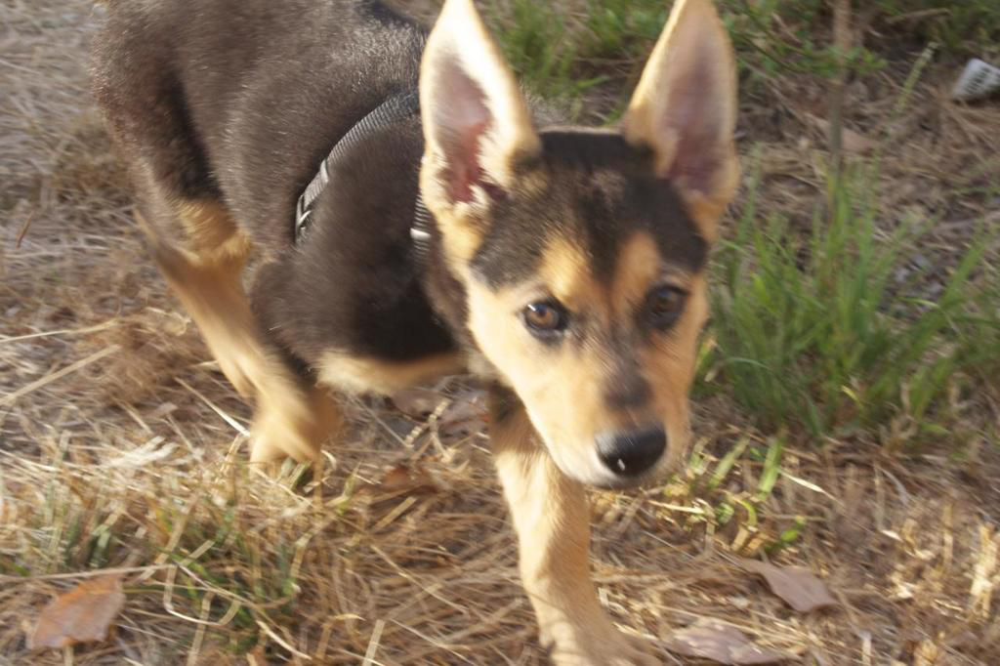

In [ ]:
# Get dog images
Dog = list(data_dir.glob('Dog/*'))
Img.open(str(Dog[3]))

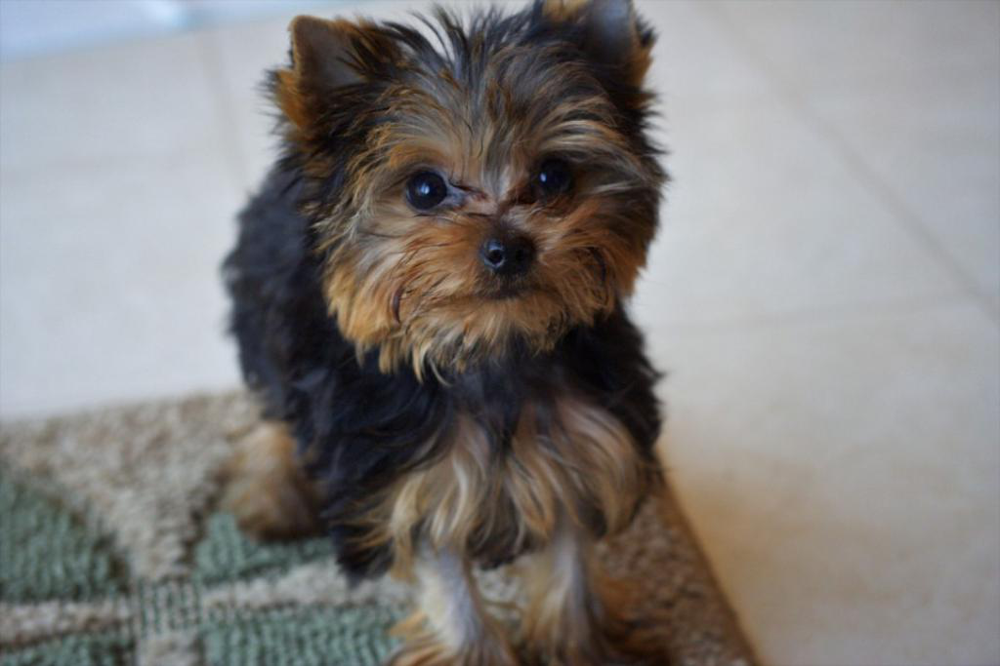

In [ ]:
# Open a dog image
Img.open(str(Dog[100]))

Here are some cars:

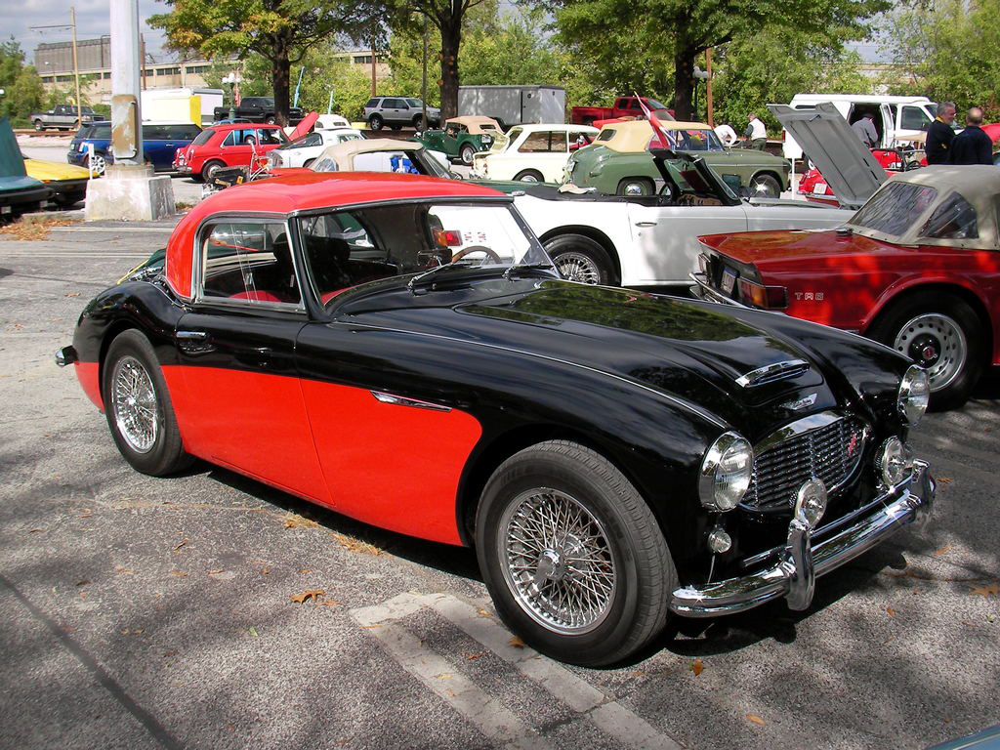

In [ ]:
# Get car images
Car = list(data_dir.glob('Car/*'))
Img.open(str(Car[1]))

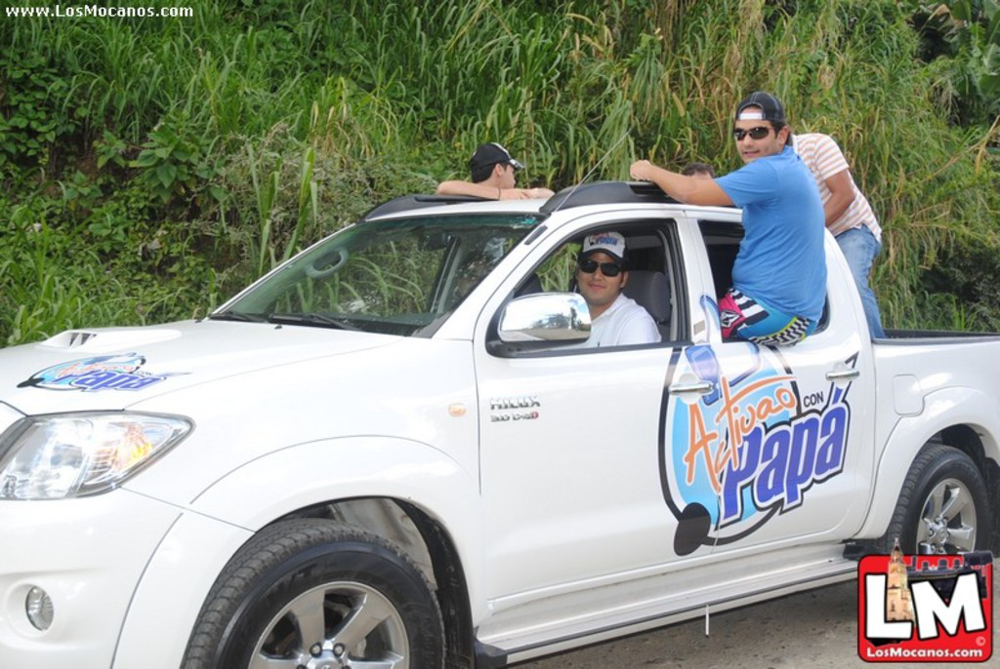

In [ ]:
# Open a car image
Img.open(str(Car[101]))

Here are some mammals:

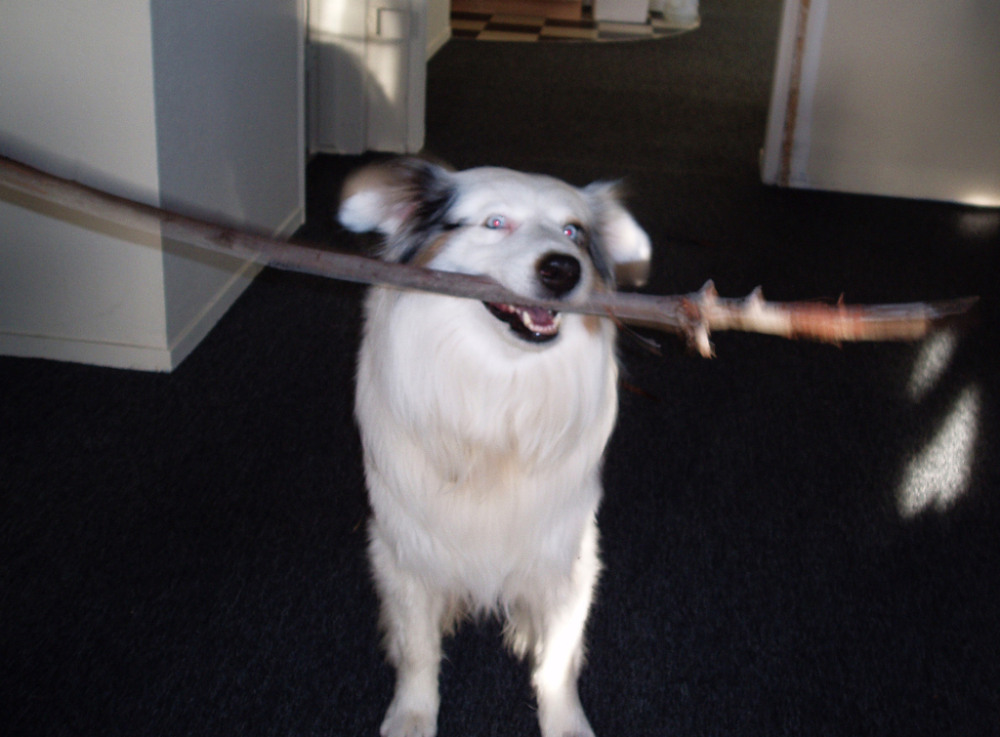

In [ ]:
# Get mammal images
Mammal = list(data_dir.glob('Mammal/*'))
Img.open(str(Mammal[4]))

In [ ]:
# Open a mammal image
Img.open(str(Mammal[25]))

Output hidden; open in https://colab.research.google.com to view.

Here are some keyboards:

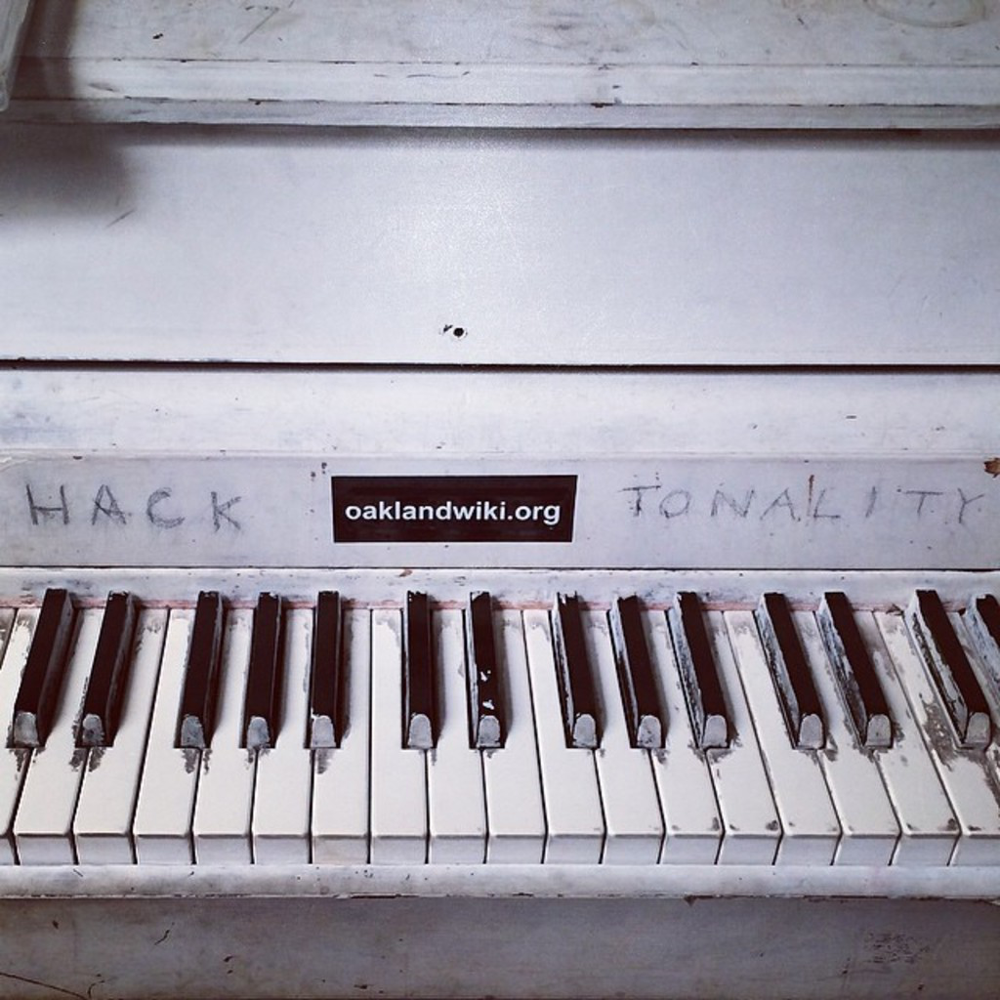

In [ ]:
# Get keyboard images
Keyboard = list(data_dir.glob('Keyboard/*'))
Img.open(str(Keyboard[3]))

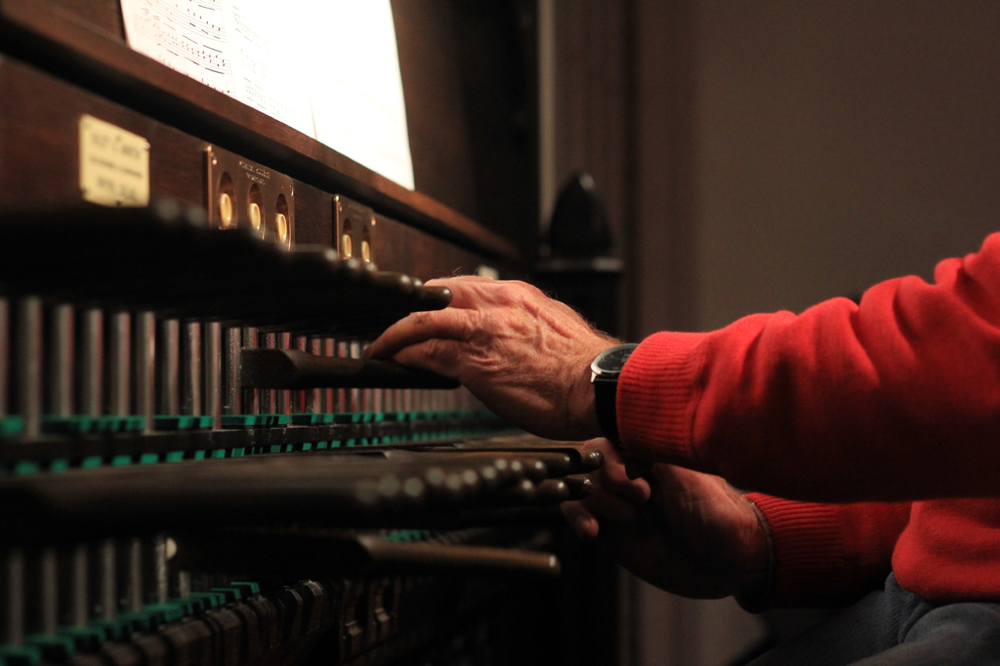

In [ ]:
# Open a keyboard image
Img.open(str(Keyboard[100]))

Here are some statues:

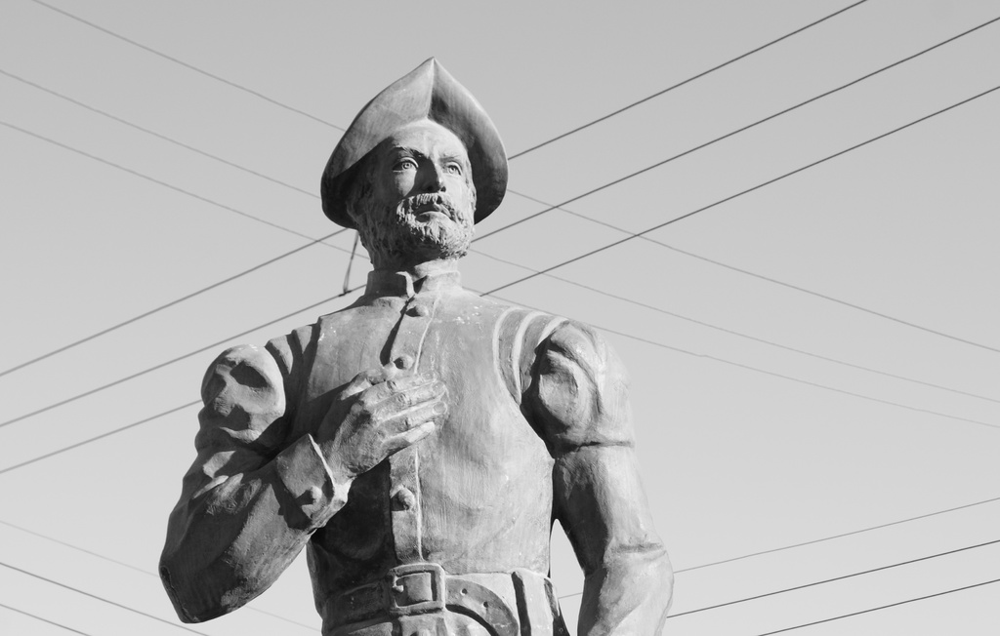

In [ ]:
# Get statue images
Statue = list(data_dir.glob('Statue/*'))
Img.open(str(Statue[3]))

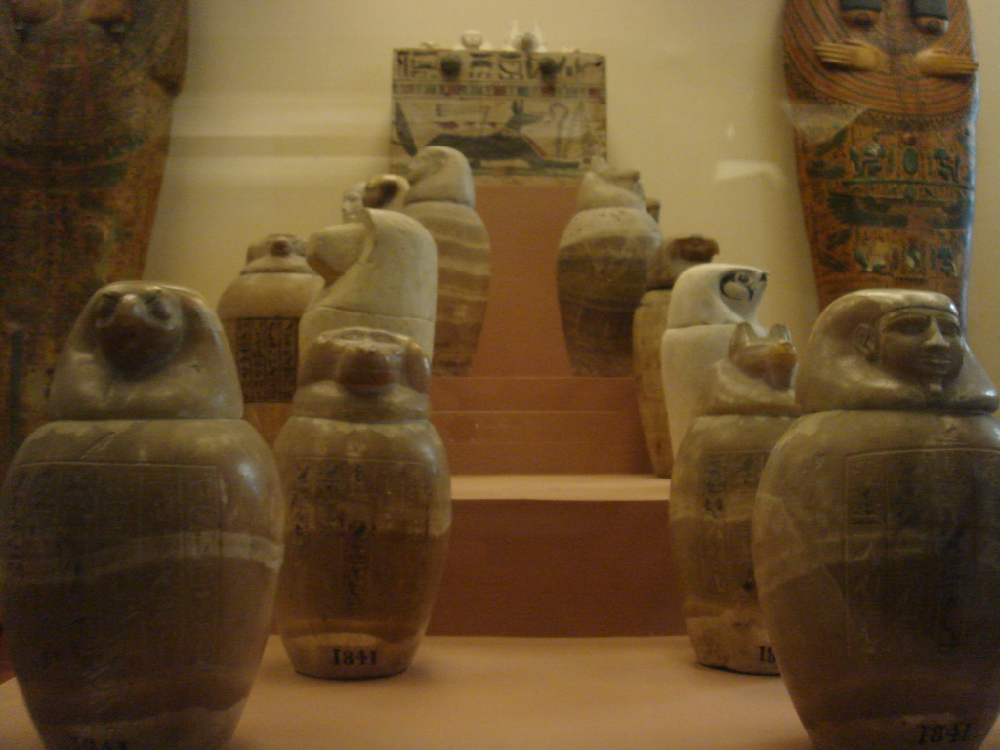

In [ ]:
# Open a statue image
Img.open(str(Statue[100]))

## Create a dataset

To train a model, we first need an dataset which the model can be trained on. So, that's what we are going to do here. 

**Step 2**: Define some parameters for the loader.

In [ ]:
# define some parameters
batch_size = 64
img_height = 250
img_width = 250

**Step 3**: Create a train dataset

In [ ]:
# create a train dataset
train_ds = tf.keras.utils.image_dataset_from_directory(train_dir,
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 4204 files belonging to 5 classes.


### Split the folder

In order to get a validation set and a test set, we need to split the train folder into a validation folder and a test folder. We can use the package splitfolder in order to do so.  

**Step 4**: Use the package splitfolders to split the train folder into 70% train, 20% validation, and 10% test folders. 

In [ ]:
# Split with a ratio.
# To only split into training and validation set, set a tuple to `ratio`, i.e, `(.8, .2)`.
splitfolders.ratio(train_dir, output=r"C:\Users\anouk\OneDrive\Documenten\Toolkit\OID\Dataset_nl\output",
    seed=1337, ratio=(.7, .2, .1), group_prefix=None, move=False) # default values


Copying files: 4204 files [00:09, 435.84 files/s]


### Validation and test dataset

**Step 5**: Retrieve validation and test directories from the previous step.

In [ ]:
# Retrieve validation and test directories
base = r"C:\Users\anouk\OneDrive\Documenten\Toolkit\OID\Dataset_nl\output"
validation_dir = os.path.join(base, 'validation')
test_dir = os.path.join(base, 'test')

**Step 6**: Create a validation dataset in order to use for validating the model

In [ ]:
# create a validation dataset
val_ds = tf.keras.utils.image_dataset_from_directory(
  validation_dir,
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 840 files belonging to 5 classes.


**Step 7**: Create a test dataset in order to use for evaluating the model

In [ ]:
# Create a test dataset
test_ds = tf.keras.utils.image_dataset_from_directory(
  test_dir,
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 422 files belonging to 5 classes.


### Class names

Here we can see the class names which the model will use as labels. Eventually, we will test the model and it will predict which label needs to be put on to the image. 

**Step 8**: Print the class names 

In [ ]:
# show the classes of the train dataset
class_names = train_ds.class_names
print(class_names)

['Car', 'Dog', 'Keyboard', 'Mammal', 'Statue']


## Visualize the data

Now, let's check if we did things right. We are going to plot the first nine images and then we will retrieve the batches of the train dataset. 

**Step 10**: Plot the first nine images

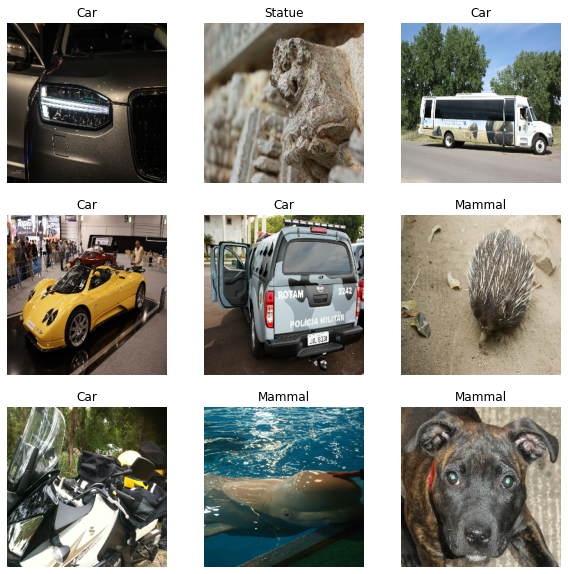

In [ ]:
# plot the first nine images
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

**Step 11**: Retrieve the batches of images of the train dataset

In [ ]:
# Retrieve the batches of images of the train dataset and print out the shape of the batches
for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(64, 250, 250, 3)
(64,)


## Configure the dataset for performance

Let's make sure to use buffered prefetching so you can yield data from disk without having I/O become blocking. These are two important methods you should use when loading data:

*   Dataset.cache keeps the images in memory after they're loaded off disk during the first epoch. This will ensure the dataset does not become a bottleneck while training your model. If your dataset is too large to fit into memory, you can also use this method to create a performant on-disk cache.
*   Dataset.prefetch overlaps data preprocessing and model execution while training.

**Step 12**: use AUTOTUNE to overlap data preprocessing and model execution while training

In [ ]:
# use AUTOTUNE to overlap data preprocessing and model execution while training
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

## Standardize the data

The RGB channel values are in the [0, 255] range. This is not ideal for a neural network; in general you should seek to make your input values small. Therefore, we are going to standardize the data.

**Step 13**: Standardize the values to be in the [0, 1] range by using tf.keras.layers.Rescaling:

In [ ]:
# use reschaling to rescale the values to [0, 1]
normalization_layer = tf.keras.layers.experimental.preprocessing.Rescaling(1./255)

**Step 14**: Apply the normalization layer to the dataset by calling Dataset.map

In [ ]:
# apply the rescaled layer to the dataset by using Dataset.map
normalized_ds = train_ds.map(lambda x, y: (normalization_layer(x), y))
image_batch, labels_batch = next(iter(normalized_ds))
first_image = image_batch[0]
# Notice the pixel values are now in `[0,1]`.
print(np.min(first_image), np.max(first_image))

0.009410967 0.99131805


## Create model

The Sequential model consists of three convolution blocks (tf.keras.layers.Conv2D) with a max pooling layer (tf.keras.layers.MaxPooling2D) in each of them. The model also consists of onee flatten layer (tf.keras.layers.Flatten) and one activation layer (tf.keras.layers.Activation). There's a fully-connected layer (tf.keras.layers.Dense) with 128 units on top of it that is activated by a ReLU activation function ('relu'). This model has not been tuned for high accuracy—the goal of this tutorial is to show a standard approach.

**Step 15**: Initialize the input shape and number of classes for the model

In [ ]:
# initialize the input shape and number of classes
Input_shape = (img_height, img_width, 3)
num_classes = len(class_names)

**Step 16**: Create the model

In [ ]:
model = Sequential()
model.add(tf.keras.layers.experimental.preprocessing.Rescaling(1./255, input_shape=(img_height, img_width, 3)))
model.add(layers.Conv2D(16, 3, padding='same', activation='relu'))
model.add(layers.MaxPooling2D())
model.add(layers.Conv2D(32, 3, padding='same', activation='relu'))
model.add(layers.MaxPooling2D())
model.add(layers.Conv2D(64, 3, padding='same'))
model.add(layers.Activation('relu'))         
model.add(layers.MaxPooling2D())
model.add(layers.Flatten())
# Choose the number of units in the first Dense layer
model.add(layers.Dense(128, activation='relu'))
model.add(layers.Dense(num_classes))

# compile the model
model.compile(optimizer='adam',
                loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                metrics=['accuracy'])

## Model Summary

**Step 17**: View all the layers of the network using the model's Model.summary method

In [ ]:
# summary of the model
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling_1 (Rescaling)      (None, 250, 250, 3)       0         
_________________________________________________________________
conv2d (Conv2D)              (None, 250, 250, 16)      448       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 125, 125, 16)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 125, 125, 32)      4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 62, 62, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 62, 62, 64)        18496     
_________________________________________________________________
activation (Activation)      (None, 62, 62, 64)        0

## Train the model

**Step 18**: Train the model with 10 epochs

In [ ]:
epochs = 10
history = model.fit(train_ds, epochs= epochs, validation_data= (val_ds))

Epoch 1/10
66/66 [==============================] - 15s 89ms/step - loss: 1.1265 - accuracy: 0.5466 - val_loss: 0.8025 - val_accuracy: 0.6524
Epoch 2/10
66/66 [==============================] - 4s 62ms/step - loss: 0.8026 - accuracy: 0.6453 - val_loss: 0.7196 - val_accuracy: 0.6905
Epoch 3/10
66/66 [==============================] - 4s 63ms/step - loss: 0.6811 - accuracy: 0.6979 - val_loss: 0.5807 - val_accuracy: 0.7321
Epoch 4/10
66/66 [==============================] - 4s 64ms/step - loss: 0.5472 - accuracy: 0.7500 - val_loss: 0.4350 - val_accuracy: 0.8155
Epoch 5/10
66/66 [==============================] - 6s 87ms/step - loss: 0.4191 - accuracy: 0.8116 - val_loss: 0.3375 - val_accuracy: 0.8726
Epoch 6/10
66/66 [==============================] - 4s 64ms/step - loss: 0.3341 - accuracy: 0.8520 - val_loss: 0.3142 - val_accuracy: 0.8821
Epoch 7/10
66/66 [==============================] - 4s 64ms/step - loss: 0.3032 - accuracy: 0.8644 - val_loss: 0.2915 - val_accuracy: 0.8798
Epoch 8/10
6

## Visualise training results

**Step 19**: Create plots of loss and accuracy on the training and validation sets

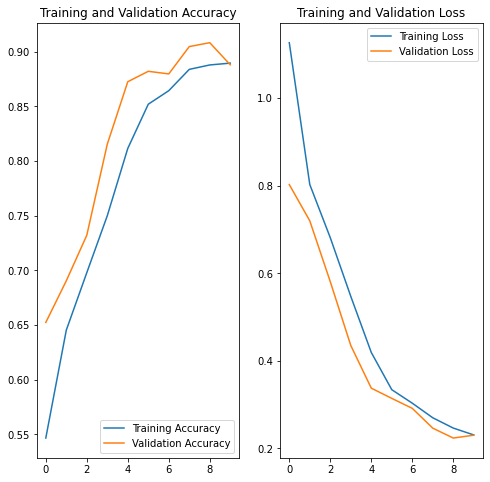

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

The plots show that training accuracy and validation accuracy are off by large margins, and the model has achieved around 90% accuracy on the validation set.

Let's try to increase the overall performance of the model, but first we are going to test the model with the test data.

## Predict on test data

Finally, let's use our model to classify an image that wasn't included in the training or validation sets.

**Step 20**: Retrieve the test loss and test accuracy of the CNN model

In [ ]:
eval_result = model.evaluate(test_ds)
print("[test loss, test accuracy]:", eval_result)

7/7 [==============================] - 1s 55ms/step - loss: 0.2014 - accuracy: 0.8981
[test loss, test accuracy]: [0.2014453411102295, 0.8981042504310608]


**Step 21**: Define path of the test images

In [ ]:
file_path_type = [r"C:\Users\anouk\OneDrive\Documenten\Toolkit\Image\*.jpg"]
files = glob.glob(random.choice(file_path_type))
random.seed()
random_image = random.choice(files)
random_image

'C:\\Users\\anouk\\OneDrive\\Documenten\\Toolkit\\Image\\9cbaba6d02989671.jpg'

**Step 22**: Open random test image

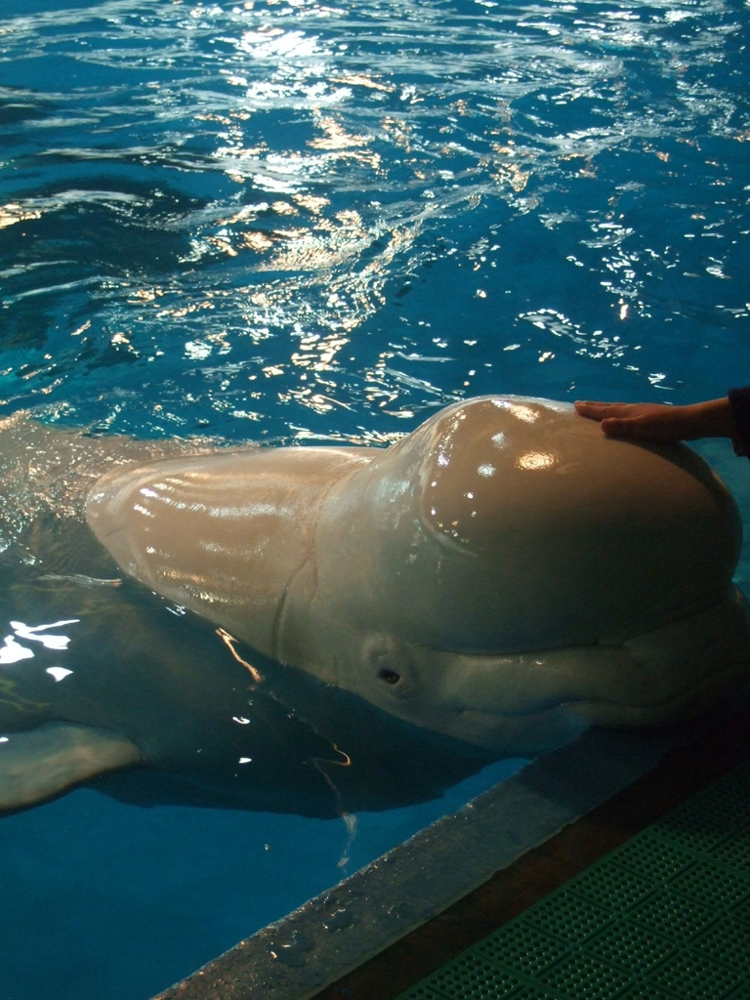

In [ ]:
#os.open(a, os.O_RDWR)
im = Img.open(random_image)
im

**Step 23**: Predict the random test image

The model is going to classifly the random image whether the image is a car, keyboard, mammal, dog or statue. It will also show the confidence (in percentage) the model has in being correct. 

In [ ]:
img = tf.keras.utils.load_img(
    random_image, target_size=(img_height, img_width)
)
img_array = tf.keras.utils.img_to_array(img)
img_array = tf.expand_dims(img_array, 0) # Create a batch

predictions = model.predict(img_array)
score = tf.nn.softmax(predictions[0])

print(
    "This image most likely belongs to {} with a {:.2f} percent confidence."
    .format(class_names[np.argmax(score)], 100 * np.max(score))
)

This image most likely belongs to Mammal with a 99.30 percent confidence.


## Interpretability & Transparency

Interpretability (or explainability) implies that in the context of predictive modelling, the model is not only able to predict outcomes accurately, but also explain how the model arrives at it's outcomes.

### Methods to make AI more explainable (or interpretable or transparant)

One of the easiest ways to make AI more transparent is to use a model that is easy to interpret. However, neural networks are not the most interpretable. In such cases, it becomes desirable to have XAI methods that can help us understand the model, but having the desirable feature that these methods can generalise across model.
 
Such methods are termed model-agnostic XAI methods and we will discover more about these methods in the next step. Model-agnostic XAI can further be categorized into global and local methods. 

Global methods aim to expain how the model arrives at it's predictions on average (i.e., global behavour). Local methods, on the other hand are more interested in explaining a single prediction (e.g., why does my model assign the label car to this image). We are going to focus on the local methods of the models.

## XAI

### Pre-processing

**Step 24**: Define class indexes for the XAI Methods

In [ ]:
if class_names[np.argmax(score)] == 'Car':
  class_index = 0
elif class_names[np.argmax(score)] == 'Dog':
  class_index = 1
elif class_names[np.argmax(score)] == 'Keyboard':
  class_index = 2
elif class_names[np.argmax(score)] == 'Mammal':
  class_index = 3
elif class_names[np.argmax(score)] == 'Statue': 
  class_index = 4

**Step 25**: Prepare random image for the XAI methods

In [ ]:
image = tf.keras.preprocessing.image.load_img(random_image, target_size=(250, 250))
image = tf.keras.preprocessing.image.img_to_array(image)
img_array = np.expand_dims(image, axis=0)

### Grad-CAM

**Step 26**: Perform Grad-CAM method on the random image

Predicted: ('Mammal', 99.29753541946411)


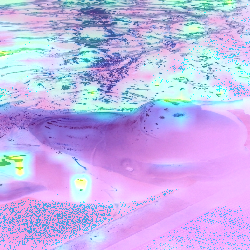

In [ ]:
#first create the input in a format that the explainer expects (a tuple)
input_img = (np.array([image]), None)

#initialize the explainer
explainer = GradCAM()

# Compute GradCAM on VGG16
grid = explainer.explain(input_img,
                         model,
                         class_index=class_index)

# Print what the top predicted class is
preds = model.predict(img_array)
print("Predicted:", (class_names[np.argmax(score)], 100 * np.max(score)))

#save the resulting image
explainer.save(grid, r"C:/Users/anouk/Downloads/", "Base_Model_Image_Grad_CAM.png")

# Display Grad CAM
display(Image(r"C:\Users\anouk\Downloads\Base_Model_Image_Grad_CAM.png"))

### Integrated Gradients

**Step 27**: Perform Integrated Gradients method on the random image

Predicted: ('Mammal', 99.29753541946411)


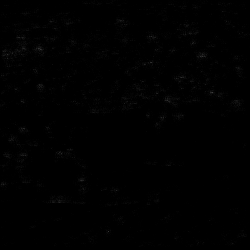

In [ ]:
#first create the input in a format that the explainer expects (a tuple)
input_img = (np.array([image]), None)

#initialize the explainer
explainer = IntegratedGradients()

# Compute GradCAM on VGG16
grid = explainer.explain(input_img,
                       model,
                       class_index=class_index)

# Print what the top predicted class is
preds = model.predict(img_array)
print("Predicted:", (class_names[np.argmax(score)], 100 * np.max(score)))

#save the resulting image
explainer.save(grid, r"C:/Users/anouk/Downloads/", "Base_Model_Image_IntegratedGrad.png")

# Display Grad CAM
display(Image(r"C:\Users\anouk\Downloads\Base_Model_Image_IntegratedGrad.png"))

### Activation Visualization

**Step 28**: Print the summary of the base model out to see the activation layers of the model

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling_1 (Rescaling)      (None, 250, 250, 3)       0         
_________________________________________________________________
conv2d (Conv2D)              (None, 250, 250, 16)      448       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 125, 125, 16)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 125, 125, 32)      4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 62, 62, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 62, 62, 64)        18496     
_________________________________________________________________
activation (Activation)      (None, 62, 62, 64)        0

**Step 29**: Perform Activation Visualization method on the random image

When the code does not work, change the number of activation layer.

Predicted: ('Mammal', 99.29753541946411)


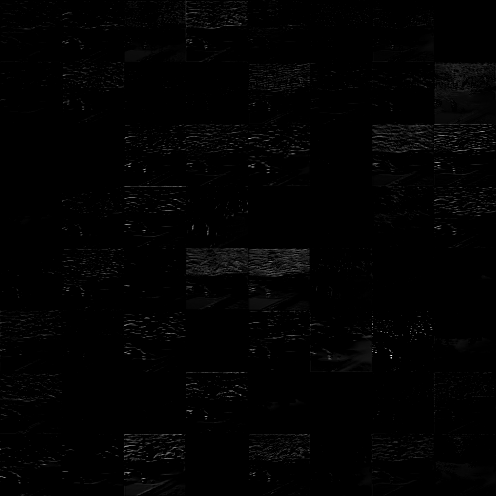

In [ ]:
#first create the input in a format that the explainer expects (a tuple)
input_img = (np.array([image]), None)

#initialize the explainer
explainer = ExtractActivations()

# Compute GradCAM on VGG16
grid = explainer.explain(input_img,
                         model,
                         layers_name='activation_3')

# Print what the top predicted class is
preds = model.predict(img_array)
print("Predicted:", (class_names[np.argmax(score)], 100 * np.max(score)))

#save the resulting image
explainer.save(grid, r"C:/Users/anouk/Downloads/", "Base_Model_Image_Activation_Visualization.png")

# Display Grad CAM
display(Image(r"C:\Users\anouk\Downloads\Base_Model_Image_Activation_Visualization.png"))

### Occlusion Sensitivity

**Step 30**: Perform Occlusion Sensitivity method on the random image

Predicted: ('Mammal', 99.29753541946411)


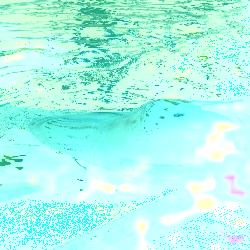

In [ ]:
#first create the input in a format that the explainer expects (a tuple)
input_img = (np.array([image]), None)

#initialize the explainer
explainer = OcclusionSensitivity()

# Compute GradCAM on VGG16
grid = explainer.explain(input_img,
                         model,
                         class_index=class_index, 
                         patch_size = 5)

# Print what the top predicted class is
preds = model.predict(img_array)
print("Predicted:", (class_names[np.argmax(score)], 100 * np.max(score)))

#save the resulting image
explainer.save(grid, r"C:/Users/anouk/Downloads/", "Base_Model_Image_Occlusion_Sensitivity.png")

# Display Grad CAM
display(Image(r"C:\Users\anouk\Downloads\Base_Model_Image_Occlusion_Sensitivity.png"))

### Impact of the XAI methods

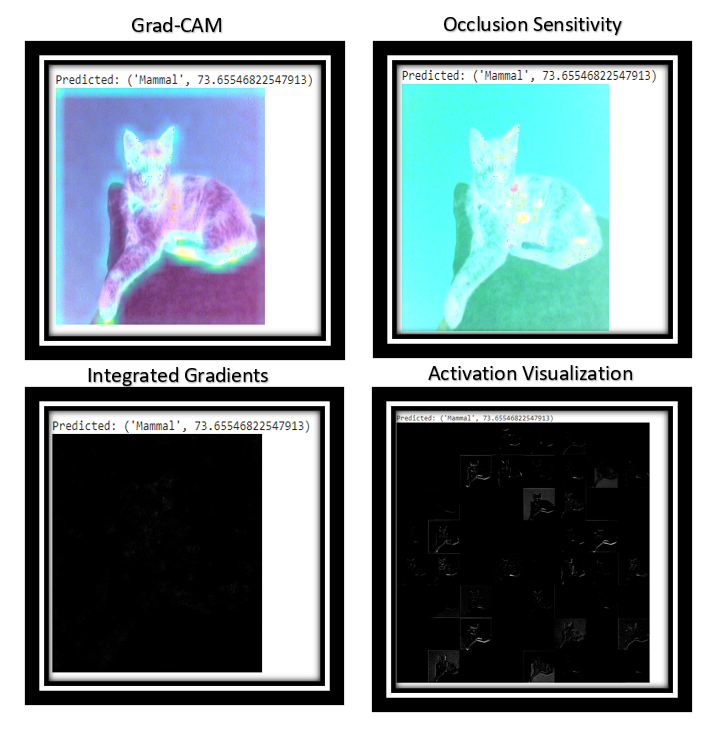

**Grad-CAMs**

Grad-CAM provides visual explanations for CNN decisions. The goal of Grad-CAM is to understand at which parts of an image a convolutional layer "looks" for a certain classification.

The first convolutional layer of a CNN takes as input the images and outputs feature maps that encode learned features. The higher-level convolutional layers do the same, but take as input the feature maps of the previous convolutional layers.

To understand how the CNN makes decisions, Grad-CAM analyzes which regions are activated in the feature maps of the last convolutional layers.

The grad-CAM defines the characteristics of a cat are starting to stand out from the general contours in the image. 

You can see how the cat’s whiskers, ears, eyes, tail, and paws are emphasized in shades of red and yellow while the rest of the image is colored in blues and greens. 

You can see how the model is reasoning how a cat’s defining characteristics differentiate this image as we get deeper into the model’s layers.

**Integrated Gradients**

Integrated Gradient (IG) is an interpretability or explainability technique for deep neural networks which visualizes its input feature importance that contributes to the model's prediction. It shows the importance of the input feature in pixels.

To understand how the CNN makes decisions, Integrated Gradient analyzes which features are important for predicting the label on the image.

Integrated Gradients shows the cat's most important features, like you can see the pixels of the ear and the head clear. Those features are apparently very important for a mammal class to the model's prediction. 

**Activation Visualization**

Activation visualizations are a simple technique to get the discriminative image regions used by a CNN to identify a specific class in the image. In other words, activation visualization lets us see which regions in the image were relevant to this class.

The activativation visualizations shows the cats' image regions which the activation layer found relevant to classify that this cat belongs to the class mammal. 

**Occlusion Sensitivity**

Occlusion sensitivity is a simple technique for understanding which parts of an image are most important for a deep network's classification. You can measure a network's sensitivity to occlusion in different regions of the data using small perturbations of the data.

The occlusion sensitivity function perturbs small areas of the input by replacing it with an occluding mask, typically a gray square. The mask moves across the image, and the change in probability score for a given class is measured as a function of mask position. You can use occlusion sensitivity to highlight which parts of the image are most important to the classification: when that part of the image is occluded, the probability score for the predicted class will fall sharply.

The occlusion sensitivity shows which parts of the image have a positive contribution to the score for the miniature cat class (mammal), and which parts have a negative contribution. 

Red areas of the map have a higher value and are evidence for the miniature cat class (mammal) — when the red areas are obscured, the score for miniature mammal goes down. 

In this image, the cat's fur provide the strongest evidence for the miniature mammal class.

yellow areas of the map with lower values are parts of the image that lead to an increase in the score for miniature mammal when occluded. 

Often, these areas are evidence of another class, and can confuse the network. In this case, some spots on the fur have a negative contribution to the overall score for miniature mammal.

So, the impact of occlusion sensitivity is that the occlusion sensitivity helps you understand the results of your network when you don't expect the results to be that way. 

The occlusion sensititvity can let you show which certain features which are yellow you could occlude to get an increase in the accuracy score for classifying mammal class. 

<font color='Red'> I will explain it only with these images, because I think this explanation explains the XAI methods very well. 

## Limitations in terms of transparency and interpretability of the base model

Now, what are the limitations of the base model?

**Unexplained functioning of the base model**

The most well known limitation of the base model is its unexplained functioning. 

When the base model gives a probing solution, it does not have a clue as why and how. This reduces trust in the network. 

Luckily, we applied XAI methods which can explain how the base model arrives at it's predictions.


**Variance of the images**

My base model has a great performance while classifying images which are very similar to the dataset. However, If the images contain some degree of tilt or rotation then the base model usually have difficulty in classifying the image. 

This can be solved by adding different variations to the image during the training process otherwise known as Data Augmentation.

**Selection** 

My base model looks in the some of the images at the background and the object itself. We can not choose whether the model looks at the background or at the object itself, because it would be more responsible if the model only look at the object. 

There is not really a python code to solve this problem. However, you could do it manually, but it would take a lot of time. You could delete the background and that leaves only the object itself. It could be that the accuracy of the model decreases, because the base model can't handle changed images. 

## Solution for the limitations in terms of transperancy and interpretability

To adress the algorithm's limitations, we are going to apply data augmentation to the second model, and we will use XAI methods for every model to explain how every model arrives at its predictions. 
For the selection of the image problem, we already explained that the solution is going to take a long time and it could be that the accuracy of the model will decrease. 

# CNN Model 2

We have the base model done, so now it is time to make improvements to the base model. First, we will apply data augmentation to flip, rotate, and zoom the images. Second, we will build the model. Third, we will search the best hyperparameters for the model by using the KerasTuner package. Eventually, we will train the model and search the best epoch. After we found the best epoch, we will train the model again. At last, we will test the model with the test data. 

We will also apply the XAI methods and plot the results of the model.

## Data augmentation

In term of interpretability, the base model could not get a high performance when the images contained some degree of tilt or rotation.
We already talked about this and that this could be solved by adding different variations to the image during the training process otherwise known as Data Augmentation.

Data augmentation takes the approach of generating additional training data from your existing examples by augmenting them using random transformations that yield believable-looking images. This helps expose the model to more aspects of the data and generalize better.

We will implement data augmentation using the following Keras preprocessing layers: tf.keras.layers.RandomFlip, tf.keras.layers.RandomRotation, and tf.keras.layers.RandomZoom. 

I added data augmentation within the model. See the first step!

### Create model

The Sequential model consists of two convolution blocks (tf.keras.layers.Conv2D) with one max pooling layer (tf.keras.layers.MaxPooling2D). The model also consists of one flatten layer (tf.keras.layers.Flatten) and two activations layers (tf.keras.layers.Activation). There's a fully-connected layer (tf.keras.layers.Dense) with 5 units on top of it that is activated by a SoftMax activation function ('softmax').

#### Define parameters

**Step 1**: Define parameters for the model like the shape of the input and number of classes

In [ ]:
# initialize the input shape and number of classes
Input_shape = (img_height, img_width, 3)
num_classes = len(class_names)

#### Define model_builder

**Step 2**: Build the model while defining the search space

In [ ]:
def build_model(hp):  # random search passes this hyperparameter() object 
    model_1 = keras.models.Sequential()
    model_1.add(layers.Conv2D(hp.Int('input_units',
                                min_value=32,
                                max_value=128,
                                step=32), (3, 3), input_shape=(img_height, img_width, 3)))
    #data augmentation
    model_1.add(layers.RandomFlip("horizontal_and_vertical"))
    model_1.add(layers.RandomRotation((-0.2, 0,3))),
    model_1.add(layers.RandomZoom((-0.2, 0,3))),
    
    model_1.add(layers.Activation(activations.relu))
    model_1.add(layers.MaxPooling2D())

    for i in range(hp.Int('n_layers', 1, 4)):  # adding variation of layers.
        model_1.add(layers.Conv2D(hp.Int(f'conv_{i}_units',
                                min_value=32,
                                max_value=128,
                                step=32), (3, 3)))
        model_1.add(layers.Activation(activations.relu))
    
    model_1.add(layers.Flatten())
    model_1.add(layers.Dense(num_classes, activation="softmax"))                       
    
    # Tune the learning rate for the optimizer
    # Choose an optimal value from 0.01, 0.001, or 0.0001
    hp_learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])
    
    model_1.compile(optimizer=keras.optimizers.Adam(learning_rate=hp_learning_rate),
                loss="sparse_categorical_crossentropy",
                metrics=['accuracy'])
    
    return model_1

### Keras Tuner

KerasTuner is a general-purpose hyperparameter tuning library. It has strong integration with Keras workflows, but it isn't limited to them: you could use it to tune scikit-learn models, or anything else.

We already defined the search space, so now we are going to start the search.

**Step 3**: Instantiate the KerasTuner search with kt.RandomSearch

In [ ]:
tuner = kt.RandomSearch(build_model,
                     objective='val_accuracy',
                     max_trials=1,
                     executions_per_trial=1,
                     overwrite = True,
                     directory=r"C:\Users\anouk\OneDrive\Documenten\Toolkit\OID\Dataset_nl\keras-tuner",
                     project_name='intro_to_kt_2')

**Step 6**: Show the summary of the tuner search space

In [ ]:
tuner.search_space_summary()

Search space summary
Default search space size: 4
input_units (Int)
{'default': None, 'conditions': [], 'min_value': 32, 'max_value': 128, 'step': 32, 'sampling': None}
n_layers (Int)
{'default': None, 'conditions': [], 'min_value': 1, 'max_value': 4, 'step': 1, 'sampling': None}
conv_0_units (Int)
{'default': None, 'conditions': [], 'min_value': 32, 'max_value': 128, 'step': 32, 'sampling': None}
learning_rate (Choice)
{'default': 0.01, 'conditions': [], 'values': [0.01, 0.001, 0.0001], 'ordered': True}


#### Stop training early

**Step 7**: Create a callback to stop training early after reaching a certain value for the validation loss.

In [ ]:
stop_early = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5)

#### Run the hyperparameter search

**Step 8**: Run the hyperparameter search

In [ ]:
tuner.search(train_ds, verbose = 2, epochs=10, validation_data=(val_ds), callbacks=[stop_early])

Trial 1 Complete [00h 10m 43s]
val_accuracy: 0.4345238208770752

Best val_accuracy So Far: 0.4345238208770752
Total elapsed time: 00h 10m 43s
INFO:tensorflow:Oracle triggered exit


**Step 9**: Show the summary of the results of the tuner

In [ ]:
tuner.results_summary()

Results summary
Results in C:\Users\anouk\OneDrive\Documenten\Toolkit\OID\Dataset_nl\keras-tuner\intro_to_kt_2
Showing 10 best trials
Trial summary
Hyperparameters:
input_units: 96
n_layers: 2
conv_0_units: 128
learning_rate: 0.001
conv_1_units: 32
Score: 0.4345238208770752


**Step 10**: Show the best hyperparameters of the tuner

In [ ]:
top_n = 10
best_hps = tuner.get_best_hyperparameters(top_n)
best_hps[0].values

{'input_units': 96,
 'n_layers': 2,
 'conv_0_units': 128,
 'learning_rate': 0.001,
 'conv_1_units': 32}

We found the best hyperparameters by running the kerastuner a few times. We will create a new model that is based on the best hyperparameters.

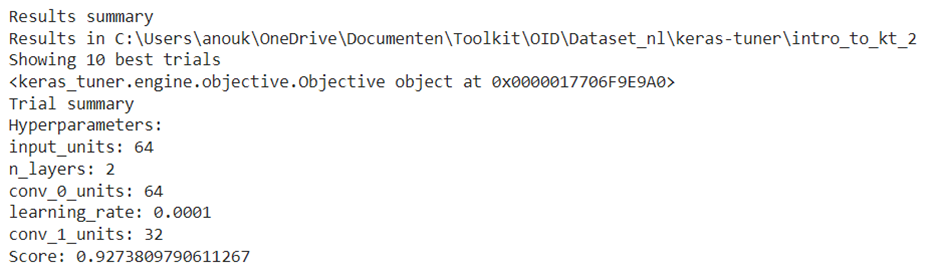

### Create new CNN model with the best hyperparameters

**Step 12**: Create a new model with the best hyperparameters

In [ ]:
def build_model(hp):  # random search passes this hyperparameter() object 
    model_2 = keras.models.Sequential()
    model_2.add(layers.Conv2D(64, 3, input_shape=(img_height, img_width, 3)))
    model_2.add(layers.RandomFlip("horizontal_and_vertical"))
    model_2.add(layers.RandomRotation((-0.2, 0,3))),
    model_2.add(layers.RandomZoom((-0.2, 0,3))),
    model_2.add(layers.Activation(activations.relu))
    model_2.add(layers.MaxPooling2D())

    model_2.add(layers.Conv2D(32, 3, padding='same', activation='relu'))

    model_2.add(layers.Activation(activations.relu))

    model_2.add(layers.Conv2D(32, 3, padding='same', activation='relu'))

    model_2.add(layers.Activation(activations.relu))
    
    model_2.add(layers.Conv2D(32, 3, padding='same', activation='relu'))

    model_2.add(layers.Activation(activations.relu))

    model_2.add(layers.Conv2D(32, 3, padding='same', activation='relu'))

    model_2.add(layers.Activation(activations.relu))
    model_2.add(layers.Dropout(0.5))

    model_2.add(layers.Flatten())
    model_2.add(layers.Dense(num_classes, activation="softmax"))                       
    
    model_2.compile(optimizer=keras.optimizers.Adam(learning_rate=0.0001),
                loss="sparse_categorical_crossentropy",
                metrics=['accuracy'])
    
    return model_2

**Step 12**: Define a function get the best epoch to train the model to get the highest validation accuracy

In [ ]:
def get_best_epoch(hp):
    model_CNN = build_model(hp)
    callbacks=[
        keras.callbacks.EarlyStopping(
            monitor="val_loss", mode="min", patience=5)
    ]
    history_1 = model_CNN.fit(
        train_ds,
        validation_data=(val_ds),
        epochs=10,
        batch_size=batch_size,
        callbacks=callbacks)
    
    # keys
    np.save(r'C:\Users\anouk\Downloads\History\my_history.npy',model_CNN.history.history)

    #best epoch
    val_loss_per_epoch = history_1.history["val_loss"]
    best_epoch = val_loss_per_epoch.index(min(val_loss_per_epoch)) + 1
    print(f"Best epoch: {best_epoch}")

    return best_epoch

**Step 13**: Train the model first with 10 epoch and then train it again with the best epoch

In [ ]:
def get_best_trained_model(hp):
  best_epoch = get_best_epoch(hp)
  history_1 = model_CNN.fit(train_ds,validation_data=(val_ds),batch_size=batch_size, epochs=int(best_epoch * 1.2))
  # keys
  np.save(r'C:\Users\anouk\Downloads\History\my_history_with_best_epoch.npy',model_CNN.history.history)

  return model_CNN

best_models = []
for hp in best_hps:
  model_CNN = build_model(hp)
  model_CNN = get_best_trained_model(hp)
  best_models.append(model_CNN)

Epoch 1/10
66/66 [==============================] - 54s 759ms/step - loss: 10.8739 - accuracy: 0.4817 - val_loss: 1.8043 - val_accuracy: 0.5750
Epoch 2/10
66/66 [==============================] - 47s 710ms/step - loss: 1.6165 - accuracy: 0.5564 - val_loss: 1.5040 - val_accuracy: 0.5595
Epoch 3/10
66/66 [==============================] - 47s 706ms/step - loss: 1.2063 - accuracy: 0.5725 - val_loss: 1.0846 - val_accuracy: 0.5881
Epoch 4/10
66/66 [==============================] - 46s 704ms/step - loss: 1.1209 - accuracy: 0.5756 - val_loss: 1.2091 - val_accuracy: 0.5952
Epoch 5/10
66/66 [==============================] - 46s 703ms/step - loss: 1.0536 - accuracy: 0.5937 - val_loss: 1.0681 - val_accuracy: 0.5845
Epoch 6/10
66/66 [==============================] - 46s 701ms/step - loss: 0.9734 - accuracy: 0.6032 - val_loss: 1.1547 - val_accuracy: 0.5810
Epoch 7/10
66/66 [==============================] - 48s 724ms/step - loss: 0.9240 - accuracy: 0.6187 - val_loss: 1.0641 - val_accuracy: 0.596

FileNotFoundError: ignored

**Step 14**: Retrieve the test loss and test accuracy of the CNN model

In [ ]:
eval_result = model_CNN.evaluate(test_ds)
print("[test loss, test accuracy]:", eval_result)

### Visualize training results

**Step 15**: Load the histories of the CNN model

In [ ]:
history_1 =np.load(r'C:\Users\anouk\Downloads\History\my_history.npy',allow_pickle='TRUE').item()
history_2 =np.load(r'C:\Users\anouk\Downloads\History\my_history_with_best_epoch.npy', allow_pickle='TRUE').item()

**Step 16**: Visualize the training results of the CNN model

In [ ]:
# without best epoch
CNN_model_acc = history_1['accuracy']
CNN_model_val_acc = history_1['val_accuracy']

CNN_model_loss = history_1['loss']
CNN_model_val_loss = history_1['val_loss']
    
epochs_range = range(10)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, CNN_model_acc, label='Training Accuracy of CNN model')
plt.plot(epochs_range, CNN_model_val_acc, label='Validation Accuracy of CNN model')

plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, CNN_model_loss, label='Training Loss of CNN model')
plt.plot(epochs_range, CNN_model_val_loss, label='Validation Loss of CNN model')

plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

**Step 17**: Retrieve the best epoch from the training results

In [ ]:
val_loss_per_epoch = history_1["val_loss"]
best_epoch = val_loss_per_epoch.index(min(val_loss_per_epoch)) + 1
print(f"Best epoch: {best_epoch}")

**Step 18**: Visualize the training results of the CNN model with the best epoch from the kerastuner

In [ ]:
# CNN model with best epoch from keras tuner
CNN_model_with_best_epoch_acc = history_2['accuracy']
CNN_model_with_best_epoch_val_acc = history_2['val_accuracy']
    
CNN_model_with_best_epoch_loss = history_2['loss']
CNN_model_with_best_epoch_val_loss = history_2['val_loss']
    
epochs_range = range(int((best_epoch * 1.2)))

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, CNN_model_with_best_epoch_acc, label='Training Accuracy of CNN model with best epoch')
plt.plot(epochs_range, CNN_model_with_best_epoch_val_acc, label='Validation Accuracy of CNN model with best epoch')

plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, CNN_model_with_best_epoch_loss, label='Training Loss of CNN model with best epoch')
plt.plot(epochs_range, CNN_model_with_best_epoch_val_loss, label='Validation Loss of CNN model with best epoch')

plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

### Predict on test data

Finally, let's use our model to classify an image that wasn't included in the training or validation sets.

**Step 19**: Open random test image

In [ ]:
#os.open(a, os.O_RDWR)
im = Img.open(random_image)
im

**Step 20**: Predict the random test image

The model is going to classifly the random image whether the image is a car, keyboard, mammal, dog or statue. It will also show the confidence (in percentage) the model has in being correct. 

In [ ]:
predictions = model_CNN.predict(img_array)
score = tf.nn.softmax(predictions[0])

print(
    "This image most likely belongs to {} with a {:.2f} percent confidence."
    .format(class_names[np.argmax(score)], 100 * np.max(score)))

## XAI

### Grad-CAM

**Step 21**: Perform Grad-CAM method on the random image

In [ ]:
#first create the input in a format that the explainer expects (a tuple)
input_img = (np.array([image]), None)

#initialize the explainer
explainer = GradCAM()

# Compute GradCAM on VGG16
grid = explainer.explain(input_img,
                         model_CNN,
                         class_index=class_index)

# Print what the top predicted class is
preds = model_CNN.predict(img_array)
print("Predicted:", (class_names[np.argmax(score)], 100 * np.max(score)))

#save the resulting image
explainer.save(grid, r"C:/Users/anouk/Downloads/", "CNN_Model_Image_Grad_CAM.png")

# Display Grad CAM
display(Image(r"C:\Users\anouk\Downloads\CNN_Model_Image_Grad_CAM.png"))

### Integrated Gradients

**Step 22**: Perform Integrated Gradients method on the random image

In [ ]:
#first create the input in a format that the explainer expects (a tuple)
input_img = (np.array([image]), None)

#initialize the explainer
explainer = IntegratedGradients()

# Compute GradCAM on VGG16
grid = explainer.explain(input_img,
                       model_CNN,
                       class_index=class_index)

# Print what the top predicted class is
preds = model_CNN.predict(img_array)
print("Predicted:", (class_names[np.argmax(score)], 100 * np.max(score)))

#save the resulting image
explainer.save(grid, r"C:/Users/anouk/Downloads/", "CNN_Model_Image_IntegratedGrad.png")

# Display Grad CAM
display(Image(r"C:\Users\anouk\Downloads\CNN_Model_Image_IntegratedGrad.png"))

### Activation Visualization

**Step 23**: Print the summary of the CNN model out to see the activation layers of the model

In [ ]:
model_CNN.summary()

**Step 24**: Perform Activation Visualization method on the random image

In [ ]:
#first create the input in a format that the explainer expects (a tuple)
input_img = (np.array([image]), None)

#initialize the explainer
explainer = ExtractActivations()

# Compute GradCAM on VGG16
grid = explainer.explain(input_img,
                         model_CNN,
                         layers_name='activation_4')

# Print what the top predicted class is
preds = model_CNN.predict(img_array)
print("Predicted:", (class_names[np.argmax(score)], 100 * np.max(score)))

#save the resulting image
explainer.save(grid, r"C:/Users/anouk/Downloads/", "CNN_Model_Image_Activation_Visualization.png")

# Display Grad CAM
display(Image(r"C:\Users\anouk\Downloads\CNN_Model_Image_Activation_Visualization.png"))

### Occlusion Sensitivity

**Step 25**: Perform Occlusion Sensitivity method on the random image

In [ ]:
#first create the input in a format that the explainer expects (a tuple)
input_img = (np.array([image]), None)

#initialize the explainer
explainer = OcclusionSensitivity()

# Compute GradCAM on VGG16
grid = explainer.explain(input_img,
                         model_CNN,
                         class_index=class_index, 
                         patch_size = 5)

# Print what the top predicted class is
preds = model_CNN.predict(img_array)
print("Predicted:", (class_names[np.argmax(score)], 100 * np.max(score)))

#save the resulting image
explainer.save(grid, r"C:/Users/anouk/Downloads/", "CNN_Model_Image_Occlusion_Sensitivity.png")

# Display Grad CAM
display(Image(r"C:\Users\anouk\Downloads\CNN_Model_Image_Occlusion_Sensitivity.png"))

# SOTA

SOTA stands for state-of-the-art image classification models. The individual models are pretrained models, and you can use these models to fit your own data to it. That's what SOTA is. 

## Transfer Learning

A pre-trained model is a saved network that was previously trained on a large dataset, typically on a large-scale image-classification task. You either use the pretrained model as is or use transfer learning to customize this model to a given task. We are going to use transfer learning to custimize the model to classifying car, dog, keyboard, mammal and statue images. 

**The goal of Transfer Learning**

The intuition behind transfer learning for image classification is that if a model is trained on a large and general enough dataset, this model will effectively serve as a generic model of the visual world. You can then take advantage of these learned feature maps without having to start from scratch by training a large model on a large dataset.

**Step 1**: Create the base model from the pre-trained model Xception and eventually fit it

In [ ]:
# create the base pre-trained model
base_model = Xception(input_shape=(img_height, img_width, 3), weights='imagenet', include_top=False)

# add a global spatial average pooling layer
x = base_model.output
x = GlobalAveragePooling2D()(x)
# let's add a fully-connected layer
x = Dense(1024, activation='relu')(x)
# and a logistic layer -- let's say we have 5 classes
predictions = Dense(5, activation='softmax')(x)

# this is the model we will train
model_TF = Model(inputs=base_model.input, outputs=predictions)

# first: train only the top layers (which were randomly initialized)
# i.e. freeze all convolutional InceptionV3 layers
for layer in base_model.layers:
    layer.trainable = False

# compile the model (should be done *after* setting layers to non-trainable)
model_TF.compile(optimizer='adam', loss= keras.losses.SparseCategoricalCrossentropy(from_logits=False), metrics=['accuracy'])

# epochs
epochs = 10

# print loss and accuracy before fitting the data
initial_epochs = 20
loss0, accuracy0 = model.evaluate(val_ds)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

# train the model on the new data for a few epochs
model_without_fine_tuning = model_TF.fit((train_ds),
validation_data=(val_ds),
epochs=epochs)

### Visualize training results

**Step 2**: Visualize the training results of the model with Transfer Learning

In [ ]:
acc = model_without_fine_tuning.history['accuracy']
val_acc = model_without_fine_tuning.history['val_accuracy']

loss = model_without_fine_tuning.history['loss']
val_loss = model_without_fine_tuning.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

## Fine Tuning

In the feature extraction experiment, you were only training a few layers on top of an MobileNetV2 base model. The weights of the pre-trained network were not updated during training.

One way to increase performance even further is to train (or "fine-tune") the weights of the top layers of the pre-trained model alongside the training of the classifier you added. The training process will force the weights to be tuned from generic feature maps to features associated specifically with the dataset.

Also, you should try to fine-tune a small number of top layers rather than the whole MobileNet model. In most convolutional networks, the higher up a layer is, the more specialized it is. The first few layers learn very simple and generic features that generalize to almost all types of images. As you go higher up, the features are increasingly more specific to the dataset on which the model was trained. The goal of fine-tuning is to adapt these specialized features to work with the new dataset, rather than overwrite the generic learning.

**Step 3**: Fine-tune the model. Freeze the bottom layers and then fit the model with the data from our own model

In [ ]:
# at this point, the top layers are well trained and we can start fine-tuning
# convolutional layers from Xception. We will freeze the bottom N layers
# and train the remaining top layers.

# let's visualize layer names and layer indices to see how many layers
# we should freeze:
for i, layer in enumerate(base_model.layers):
   print(i, layer.name)

# we chose to train the top 2 inception blocks, i.e. we will freeze
# the first 249 layers and unfreeze the rest:
for layer in model_TF.layers[:65]:
   layer.trainable = False
for layer in model_TF.layers[65:]:
   layer.trainable = True

# we need to recompile the model for these modifications to take effect
# we use SGD with a low learning rate
model_TF.compile(optimizer='adam',
                loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                metrics=['accuracy'])

# we train our model again (this time fine-tuning the top 2 inception blocks
# alongside the top Dense layers
model_with_fine_tuning = model_TF.fit(train_ds,
  validation_data=val_ds,
  epochs=epochs)

### Visualize training results

**Step 4**: Visualize the training results of the fine-tuned model

In [ ]:
acc = model_with_fine_tuning.history['accuracy']
val_acc = model_with_fine_tuning.history['val_accuracy']

loss = model_with_fine_tuning.history['loss']
val_loss = model_with_fine_tuning.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

## Predict on test data

**Step 5**: Retrieve the test loss and test accuracy of the CNN model

In [ ]:
eval_result = model_TF.evaluate(test_ds)
print("[test loss, test accuracy]:", eval_result)

**Step 6**: Open random image

In [ ]:
#os.open(a, os.O_RDWR)
im = Img.open(random_image)
im

**Step 7**: Predict the random test image

Finally, let's test our model for the last time with the test image.

In [ ]:
predictions = model_TF.predict(img_array)
score = predictions[0]

print(
    "This image most likely belongs to {} with a {:.2f} percent confidence."
    .format(class_names[np.argmax(score)], 100 * np.max(score))
)

## XAI

As you can see here, the transfer learning and fine tuning model does not include the XAI method activation visualization, because the pretrained model did not include seperate activation layers.

### Grad-CAM

**Step 8**: Perform Grad-CAM method on the random image

In [ ]:
#first create the input in a format that the explainer expects (a tuple)
input_img = (np.array([image]), None)

#initialize the explainer
explainer = GradCAM()

# Compute GradCAM on VGG16
grid = explainer.explain(input_img,
                         model_TF,
                         class_index=class_index)

# Print what the top predicted class is
preds = model_TF.predict(img_array)
print("Predicted:", (class_names[np.argmax(score)], 100 * np.max(score)))

#save the resulting image
explainer.save(grid, r"C:/Users/anouk/Downloads/", "TF_Model_Image_Grad_CAM.png")

# Display Grad CAM
display(Image(r"C:\Users\anouk\Downloads\TF_Model_Image_Grad_CAM.png"))

### Integrated Gradients

**Step 9**: Perform Integrated Gradients method on the random image

In [ ]:
#first create the input in a format that the explainer expects (a tuple)
input_img = (np.array([image]), None)

#initialize the explainer
explainer = IntegratedGradients()

# Compute GradCAM on VGG16
grid = explainer.explain(input_img,
                         model_TF,
                         class_index=class_index)

# Print what the top predicted class is
preds = model_TF.predict(img_array)
print("Predicted:", (class_names[np.argmax(score)], 100 * np.max(score)))

#save the resulting image
explainer.save(grid, r"C:/Users/anouk/Downloads/", "TF_Model_Image_IntegratedGrad.png")

# Display Grad CAM
display(Image(r"C:\Users\anouk\Downloads\TF_Model_Image_IntegratedGrad.png"))

### Occlusion Sensitivity

**Step 10**: Perform Occlusion Sensitivity method on the random image

In [ ]:
#first create the input in a format that the explainer expects (a tuple)
input_img = (np.array([image]), None)

#initialize the explainer
explainer = OcclusionSensitivity()

# Compute GradCAM on VGG16
grid = explainer.explain(input_img,
                         model_TF,
                         class_index=class_index, 
                         patch_size = 5)

# Print what the top predicted class is
preds = model_TF.predict(img_array)
print("Predicted:", (class_names[np.argmax(score)], 100 * np.max(score)))

#save the resulting image
explainer.save(grid, r"C:/Users/anouk/Downloads/", "TF_Model_Image_Occlusion_Sensitivity.png")

# Display Grad CAM
display(Image(r"C:\Users\anouk\Downloads\TF_Model_Image_Occlusion_Sensitivity.png"))

# Overall Performance

At the end, we have three models, but which one is the best? That's what we are going to find out here. We first will look at the best model who can explain its prediction the best with the XAI methods. Then we will look at the start of fine-tuning and transfer learning on the CNN model. At last, we will have a comparison between all the models' accuracies and losses.

## XAI comparison between all models

**Step 1**: Insert all the images from the models of the XAI methods

In [ ]:
# Grad CAMS
Base_Model_Grad_CAM = mpimg.imread(r"C:\Users\anouk\Downloads\Base_Model_Image_Grad_CAM.png")
CNN_Model_Grad_CAM = mpimg.imread(r"C:\Users\anouk\Downloads\CNN_Model_Image_Grad_CAM.png")
TF_Model_Grad_CAM = mpimg.imread(r"C:\Users\anouk\Downloads\TF_Model_Image_Grad_CAM.png")

# IntegratedGrad
Base_Model_IntegratedGrad = mpimg.imread(r"C:\Users\anouk\Downloads\Base_Model_Image_IntegratedGrad.png")
CNN_Model_IntegratedGrad = mpimg.imread(r"C:\Users\anouk\Downloads\CNN_Model_Image_IntegratedGrad.png")
TF_Model_IntegratedGrad = mpimg.imread(r"C:\Users\anouk\Downloads\TF_Model_Image_IntegratedGrad.png")

# Activation Visualization 
Base_Model_Activation_Visualization = mpimg.imread(r"C:\Users\anouk\Downloads\Base_Model_Image_Activation_Visualization.png")
CNN_Model_Activation_Visualization = mpimg.imread(r"C:\Users\anouk\Downloads\CNN_Model_Image_Activation_Visualization.png")

# Occlusion Sensitivity
Base_Model_Occlusion_Sensitivity = mpimg.imread(r"C:\Users\anouk\Downloads\Base_Model_Image_Occlusion_Sensitivity.png")
CNN_Model_Occlusion_Sensitivity = mpimg.imread(r"C:\Users\anouk\Downloads\CNN_Model_Image_Occlusion_Sensitivity.png")
TF_Model_Occlusion_Sensitivity = mpimg.imread(r"C:\Users\anouk\Downloads\TF_Model_Image_Occlusion_Sensitivity.png")

**Step 2**: Plotting the images for comparison

In [ ]:
fig = plt.figure(figsize = (15, 15))
ax1 = fig.add_subplot(4,4,1)
plt.ylabel("Base Model")
ax1.imshow(Base_Model_Grad_CAM)
plt.title("Grad CAM")
ax2 = fig.add_subplot(4,4,2)
ax2.imshow(Base_Model_IntegratedGrad)
plt.title("IntegratedGrad")
ax3 = fig.add_subplot(4,4,3)
ax3.imshow(Base_Model_Activation_Visualization)
plt.title("Activation Visualization")
ax4 = fig.add_subplot(4,4,4)
ax4.imshow(Base_Model_Occlusion_Sensitivity)
plt.title("Occlusion Sensitivity")
# CNN Model
ax5 = fig.add_subplot(4,4,5)
plt.ylabel("CNN Model")
ax5.imshow(CNN_Model_Grad_CAM)
ax6 = fig.add_subplot(4,4,6)
ax6.imshow(CNN_Model_IntegratedGrad)
ax7 = fig.add_subplot(4,4,7)
ax7.imshow(CNN_Model_Activation_Visualization)
ax8 = fig.add_subplot(4,4,8)
ax8.imshow(CNN_Model_Occlusion_Sensitivity)

## TF Model
ax9 = fig.add_subplot(4,4,9)
plt.ylabel("TF Model")
ax9.imshow(TF_Model_Grad_CAM)
ax8 = fig.add_subplot(4,4,10)
ax8.imshow(TF_Model_IntegratedGrad)
ax10 = fig.add_subplot(4,4,12)
ax10.imshow(TF_Model_Occlusion_Sensitivity)

If I were to choose which model best represents the XAI methods, I will choose the base model. The base model has the best grad-CAM, Integrated Gradients, Activation Visualization, and Occlusion Sensitivity.

The pixels in the integrated gradients are more clear and you can clearly see the difference between the activation visualizations. In the occlusion sensitivity, the background is more blue which makes it easier to see how the model interprets the image. The grad-CAM shows more features in the image from the base model rather than the CNN model or the TF model. 

## Start of Transfer Learning

In [ ]:
def compare_histories(original_history, new_history, initial_epochs):
    """
    Compares two model history objects.
    """
    acc = original_history["accuracy"]
    loss = original_history["loss"]
    
    val_acc = original_history["val_accuracy"]
    val_loss = original_history["val_loss"]

    total_acc = acc + new_history.history["accuracy"]
    total_loss = loss + new_history.history["loss"]

    total_val_acc = val_acc + new_history.history["val_accuracy"]
    total_val_loss = val_loss + new_history.history["val_loss"]

    plt.figure(figsize=(9, 9))
    plt.subplot(2, 1, 1)
    plt.plot(total_acc, label='Training Accuracy')
    plt.plot(total_val_acc, label='Validation Accuracy')
    plt.plot([initial_epochs-1, initial_epochs-1],
              plt.ylim(), label='Start of Transfer Learning')
    plt.legend(loc='lower right')
    plt.title('Training and Validation Accuracy')

    plt.subplot(2, 1, 2)
    plt.plot(total_loss, label='Training Loss')
    plt.plot(total_val_loss, label='Validation Loss')
    plt.plot([initial_epochs-1, initial_epochs-1],
              plt.ylim(), label='Start of Transfer Learning')
    plt.legend(loc='upper right')
    plt.title('Training and Validation Loss')
    plt.xlabel('epoch')
    plt.show()

In [ ]:
compare_histories(history_1, model_without_fine_tuning, initial_epochs=10)

Hmm… that is a good plot. The training and validation curves look good for the feature extraction model, however, after transfer learning, after just one epoch, the training loss increases significantly while the training accuracy decreases sharply. All this time, the validation accuracy and loss begin to plateau. This surely denotes that our model is over-fitting after an epoch. Other regularization techniques including drop-outs, augmentation and Early-Stopping callback techniques can be used to reduce over-fitting. However, I already did that on the feature extraction model. 

## Start of Fine Tuning

In [ ]:
def compare_histories_fine_tuning(original_history, new_history, initial_epochs):
    """
    Compares two model history objects.
    """
    acc = original_history["accuracy"]
    loss = original_history["loss"]
    
    val_acc = original_history["val_accuracy"]
    val_loss = original_history["val_loss"]

    total_acc = acc + new_history.history["accuracy"]
    total_loss = loss + new_history.history["loss"]

    total_val_acc = val_acc + new_history.history["val_accuracy"]
    total_val_loss = val_loss + new_history.history["val_loss"]

    plt.figure(figsize=(9, 9))
    plt.subplot(2, 1, 1)
    plt.plot(total_acc, label='Training Accuracy')
    plt.plot(total_val_acc, label='Validation Accuracy')
    plt.plot([initial_epochs-1, initial_epochs-1],
              plt.ylim(), label='Start of Fine Tuning')
    plt.legend(loc='lower right')
    plt.title('Training and Validation Accuracy')

    plt.subplot(2, 1, 2)
    plt.plot(total_loss, label='Training Loss')
    plt.plot(total_val_loss, label='Validation Loss')
    plt.plot([initial_epochs-1, initial_epochs-1],
              plt.ylim(), label='Start of Fine Tuning')
    plt.legend(loc='upper right')
    plt.title('Training and Validation Loss')
    plt.xlabel('epoch')
    plt.show()

In [ ]:
compare_histories_fine_tuning(history_1, model_with_fine_tuning, initial_epochs=10)

Hmm… that is a good plot. The training and validation curves look good for the feature extraction model, however, after fine-tuning, after just one epoch, the validation loss increases significantly while the validation accuracy decreases sharply. All this time, the training accuracy and loss begin to plateau. This surely denotes that our model is over-fitting after an epoch. Other regularization techniques including drop-outs, augmentation and Early-Stopping callback techniques can be used to reduce over-fitting.

## Accuracy and loss comparison between all the models

In [ ]:
# base model
base_model_acc = history.history['accuracy']
base_model_val_acc = history.history['val_accuracy']

base_model_loss = history.history['loss']
base_model_val_loss = history.history['val_loss']


# CNN model
# Load the history from the CNN model
history_1 =np.load(r'C:\Users\anouk\Downloads\History\my_history.npy',allow_pickle='TRUE').item()
# Insert function get_best_trained_model(hp) to use the history of the model
CNN_model_acc = history_1['accuracy']
CNN_model_val_acc = history_1['val_accuracy']

CNN_model_loss = history_1['loss']
CNN_model_val_loss = history_1['val_loss']

# model with transfer learning without fine-tuning
TF_model_acc = model_without_fine_tuning.history['accuracy']
TF_model_val_acc = model_without_fine_tuning.history['val_accuracy']

TF_model_loss = model_without_fine_tuning.history['loss']
TF_model_val_loss = model_without_fine_tuning.history['val_loss']


# model with fine tuning
fine_tune_model_acc = model_with_fine_tuning.history['accuracy']
fine_tune_model_val_acc = model_with_fine_tuning.history['val_accuracy']

fine_tune_model_loss = model_with_fine_tuning.history['loss']
fine_tune_model_val_loss = model_with_fine_tuning.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(15, 15))
plt.subplot(2, 1, 1)
plt.plot(epochs_range, base_model_acc, label='Training Accuracy of base model')
plt.plot(epochs_range, base_model_val_acc, label='Validation Accuracy of base model')
plt.plot(epochs_range, CNN_model_acc, label='Training Accuracy of CNN model')
plt.plot(epochs_range, CNN_model_val_acc, label='Validation Accuracy of CNN model')
plt.plot(epochs_range, TF_model_acc, label='Training Accuracy of TF model')
plt.plot(epochs_range, TF_model_val_acc, label='Validation Accuracy of TF model')
plt.plot(epochs_range, fine_tune_model_acc, label='Training Accuracy of Fine Tune model')
plt.plot(epochs_range, fine_tune_model_val_acc, label='Validation Accuracy of Fine Tune model')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy of all models')

plt.subplot(2, 1, 2)
plt.plot(epochs_range, base_model_loss, label='Training Loss of base model')
plt.plot(epochs_range, base_model_val_loss, label='Validation Loss of base model')
plt.plot(epochs_range, CNN_model_loss, label='Training Loss of CNN model')
plt.plot(epochs_range, CNN_model_val_loss, label='Validation Loss of CNN model')
plt.plot(epochs_range, TF_model_loss, label='Training Loss of TF model')
plt.plot(epochs_range, TF_model_val_loss, label='Validation Loss of TF model')
plt.plot(epochs_range, fine_tune_model_loss, label='Training Loss of Fine Tune model')
plt.plot(epochs_range, fine_tune_model_val_loss, label='Validation Loss of Fine Tune model')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss of all models')
plt.show()

So, we see here that the base model is the best to classify images. The accuracy of the base model as well as the validation accuracy is the highest. 

**Base model**

The validation accuracy is a little bit overfitting and the training accuracy is quite good. 

The training and the validation loss are pretty low, so that's perfect. 

**CNN model**

The training accuracy and the validation accuracy are low compared to the other models. I don't think there is underfitting or overfitting, because the lines are pretty straight. 

The training loss and validation loss are pretty high compated to the other models, but that makes sense because the CNN model has also the lowest accuracy.

**TF model**

So, the training accuracy and the validation accuracy are quite good, but the validation accuracy is overfitting. The lines are not adjacent to each other. 

The training loss and the validation loss are quite good even though the model is overfitting.

**Fine Tune model**

The training accuracy is quite similar to the training accuracy of the TF model. The validation accuracy is certainly overfitting. You can clearly see it. 

The training loss of the fine tune model is quite normal compared to the other models, but the validation loss is increasing at epoch 6 for a bit. 

# Feedback for next time

- Use the base model to improve its performance next time, because I created a new model with same layers, but I actually should use the keras tuner on the base model. I don't have enough time to change that. That's why I add it as a feedback point.
- Use more epochs next time to train the model more. 
- Data Augmentation is used incorrectly, or at least I think so, because it decreases my accuracy while data augmentation should increase the accuracy. 